## Aggregate Metrics into Figures of Merit - Microlensing ##

**Credit:** 
Natasha S. Abrans (Harvard University)
The results of this are described in:

LSST Cadence Note - Microlensing Discovery and Characterization Efficiency at Different Timescales by Abrams et al.

LSST Cadence Note - Alerting transient phenomena in the Galactic Plane in time to coordinate follow-up by Hundertmark et al.


**Based off the notebook from:**
Fabio Ragosta (INAF and University of Naples "Federico II") and Xiaolong Li (University of Delaware)

Very minor edits and explanatory comments ('###') by Will Clarkson, UM-Dearborn

**The notebook presents a function which take as input the bundleDicts from the metric and it builds a bar plot with the rank of all the opsims. The rank is estimated summing the metric value all over the footprint. This output is surpressed and used to create lineplots for the microlensing metric at different timescales.**

### Some control variables ###

In [1]:
# Your username (for locating the MAF output to be plotted)
your_username = 'nsabrams'

# directory in your persistent workspace with MAF output
searchTail = 'LSST_Hackathon/F0' 

# Path for output table
pathTableOut = './testFoMs.csv'

# Ranking the FoMs by family?
byFamily = True

# colormap for plot
cmap='viridis_r'

In [2]:
%matplotlib inline
import sys,os, glob
import numpy as np
import math
from lsst.sims.maf.utils.opsimUtils import *

# add opsimUtils module path to search
import sys
sys.path.insert(0, '../LSST_OpSim/Scripts_NBs')
#from lsst.sims.maf.utils.opsimUtils import *
from opsimUtils import *


import matplotlib.pyplot as plt
import pandas as pd
import lsst.sims.maf.slicers as slicers
import lsst.sims.maf.metrics as metrics
import lsst.sims.maf.metricBundles as metricBundles
import lsst.sims.maf.db as db
import lsst.sims.maf.plots as plots
from lsst.sims.maf.metrics import BaseMetric
from lsst.sims.maf.utils import m52snr, sigma_slope, astrom_precision
from builtins import zip
import matplotlib.cm as cm

In [3]:
# to aggregate the results into a table for convenient output
from astropy.table import Table, Column

In [4]:
plt.rc('legend', fontsize=10)

- your_username has to be set to be able to access to the proper directory.

- outDir has to be set to be able to access to the MAFOutput file.

In [5]:
searchTail = 'LSST_Hackathon/simple_runs_output' 


if your_username == '': # do NOT put your username here, put it in the cell at the top of the notebook.
    raise Exception('Please provide your username!  See the top of the notebook.')
    
outDir = '/home/idies/workspace/Storage/{}/persistent/{}'.format(your_username, searchTail)


resultDbs = getResultsDbs(outDir)

# the following line will be useful if you did not run MAF on all 75 opsims
#Here we upload the results from the MAFoutput of interest
runNames = list(resultDbs.keys())
bundleDicts = {}
for runName in runNames:
       bundleDicts[runName] = bundleDictFromDisk(resultDbs[runName], runName, outDir)


nomalization factors and/or tresholds for the FOM and MAF values can be set in the function to plot the selection we want to show.

- norm can be a string ('std'),in this case it apply as normalization the standard deviation of the MAF distribution over the footprint; norm can be None, in this case no normalization is applyed; norm can be a dictionary with the normalization value for all the opsim for the number of metrics we want to plot.

- threshold_max is the upper limit for the threshold.

- treshold_max is the lower limit for the threshold.

- byfamily is a boolean variable, if True the Opsims are sorted by theri families.

In [12]:
def get_family(df):
    """get family of opsim"""
    
    ### Uses string parsing of the OpSIM filename to determine the family to which the opsim belongs.
    return df[0].split('_')[0]

def FOM(bundleDicts, norm=None, treshold_min =None, treshold_max =None, filename=None, byfamily=True, \
        tablePath='', Verbose=True, cmap='plasma', **karg):
    data_bundle = {}
    data = {}
    FOMs = [] ### One figure of merit per metric per run. Shape: (nMetrics x nRuns)
    runNames= list(bundleDicts.keys())
    metrics = bundleDicts[runNames[0]].keys()
          
    
    for metric in metrics:
        data_bundle[metric]={}
        data[metric]={}
        FOM=[]
        for runName in runNames: 
            
            ### Re-form the MAF output into a Pandas dataframe for easier processing below
            data_bundle[metric][runName]= pd.DataFrame(bundleDicts[runName][metric].metricValues[np.where(bundleDicts[runName][metric].metricValues.mask == False)])[0]
            data[metric][runName]= [] 

            ### Accumulate a 1D array of metric values for this metric for this run, over the set of HEALPIX
            ### for which a valid and finite metric value is found. 
            for i in range(len(data_bundle[metric][runName])):        
                if data_bundle[metric][runName][i]:
                    data[metric][runName].append(data_bundle[metric][runName][i])
            data[metric][runName]=np.array(data[metric][runName])[np.where(np.isfinite(data[metric][runName]))]

            ### If the user specified lower and upper thresholds, only consider further those HEALPIX whose
            ### value for *this* metric lies between the thresholds. The thresholds can be supplied either as 
            ### a dictionary with one value per metric, or as a single scalar each for hi and lo over all
            ### the metrics. If no threshold was given, consider all the HEALPIX for which this metric has 
            ### been computed. 
            if treshold_min !=None and treshold_max !=None :
                if isinstance(treshold_min,dict) and isinstance(treshold_max,dict):
                    ID_fom=np.where((data[metric][runName]>treshold_min[metric][runName]) & (data[metric][runName]<treshold_max[metric][runName]))
                else:
                    ID_fom=np.where((data[metric][runName]>treshold_min) & (data[metric][runName]<treshold_max))
            else:
                if treshold_min !=None:
                    if isinstance(treshold_min,dict):
                        ID_fom=np.where(data[metric][runName]>treshold_min[metric][runName])
                    else:
                        ID_fom=np.where(data[metric][runName]>treshold_min)
                elif treshold_max !=None :
                    if isinstance(treshold_min,dict):
                        ID_fom=np.where(data[metric][runName]>treshold_max[metric][runName])
                    else:
                        ID_fom=np.where(data[metric][runName]>treshold_max)
                else:
                    ID_fom=np.repeat(True, len(data[metric][runName]))
            
            ### Normalize this metric value over its run of values across the set of HEALPIX. Choice of 
            ### normalization user-selectable: if a dictionary is passed in as "norm" - one value per metric
            ### - then that normalization is used. Default is to do no rescaling. 
            if norm =='std':
                N= 1.0/np.std(data[metric][runName][ID_fom])
            elif norm==None:
                N=np.repeat(1,len(data[metric][runName][ID_fom]))
            else:
                N=norm[metric][runName][ID_fom]
            
            ### Metric value for each HEALPIX, normalized by factor N (see options above)
            fom = np.array(data[metric][runName][ID_fom])*N
            
            ### Sum this metric for this run over the HEALPIX, and append to master-array over the runs
            FOM.append(fom.sum())
           
        ### Append the run of FoMs for this metric over the runs, to the master-list of FoMs for all the 
        ### metrics. This list consists of one 1D (length nRuns) numpy array per metric.
        FOM=np.array(FOM)
        FOMs.append(FOM) 
    
    # 2020-08-05 package the FOMs into a table so that we can output to disk
    ### Only write the table if the user has specified an output filename for it to be written to.
    ### (Do we want the method to return the table back to the calling cell?)
    if len(tablePath) > 3:
        tWrite = Table()
        tWrite['runNames'] = runNames
        for iMetric in range(len(metrics)):
            thisFom = FOMs[iMetric]
            colName = list(metrics)[iMetric][-1] ### keys are a dict_keys object
            thisCol = Column(name=colName, data=thisFom)
            tWrite.add_column(thisCol)
            
        ### Add a column giving the sum over the metrics for each run and write to disk
        tWrite.add_column(Column(name='FomSum', data=np.sum(FOMs, axis=0)))           
        tWrite.write(tablePath, overwrite=True)
        
        ### If the user wants to see screen output, create a copy of a subset of the table, 
        ### format the numbers sensibly, and print the subset to stdout.
        if Verbose:
            print("Written FoM sums to path %s. Contents:" % (tablePath))
            tShow = Table(data=tWrite[0:3], copy=True)
            for colSho in tShow.colnames:
                if colSho == 'runNames':
                    continue
                tShow[colSho].format='%.3f'
            tShow.pprint()
            
    # --- end of syntax to construct and write table --- 
            
    import matplotlib.cm as cm
    
    ### Apply matplotlib settings and a stylesheet
    plt.rcdefaults()
    #plt.style.use('seaborn-dark')
     
    fig, ax = plt.subplots(figsize=(8,30))
    y_pos = np.arange(len(bundleDicts.keys()))
    
    ### make colormap user-selectable:
    try:
        ccm = cm.get_cmap(cmap)
    except:
        ccm = cm.get_cmap('rainbow')
    colorlist = ccm(np.linspace(0, 1, len(FOMs)))
    d= np.zeros(len(runNames))
    dplt=[]
    
    ### Inherit the plot labels from the set of MAF outputs
    FOM_labels= list(bundleDicts[runNames[0]].keys())
    df_new = pd.DataFrame(bundleDicts.keys(), columns=['db'])
    for i, (FOM, maf) in enumerate(zip(FOMs,FOM_labels)):
        d = d+ FOM
        #dplt.append(d)
        df_new[maf]= d
    df_new['db'] = df_new['db'].apply(lambda x: x.replace("_v1.4_10yrs", "") )
    df_new['db'] = df_new['db'].apply(lambda x: x.replace("v1.4_10yrs", "") )
    df_new['family'] = df_new.apply(get_family, axis=1)

    ### Optionally, rank the FoMs in the plot by family, as determined by string parsing
    ### of the OpSIM filename (see "def get_family()" above in this cell.). Otherwise, 
    ### rank globally over the entire set of runs.
    if byfamily:
        df_ = df_new.sort_values(by=[ 'family',FOM_labels[-1]], ascending=[False, False])
    else:
        df_ = df_new.sort_values(by=[FOM_labels[-1]], ascending=[False])
    
    ##df_ = df_new.sort_values(by=[ 'family',FOM_labels[-1]], ascending=[False, False])
    #idx = sorted([name_tick,d], key = lambda x: (x[1],x[2]))
    #idx=np.argsort((d,name_tick))
    #idx=idx[::-1]
    
    ### Adds the stacked bar plot for each run to the bar plot, in descending order of rank
    for i in reversed(range(len(FOMs))):
        #ax.barh(y_pos,dplt[i][idx], align='center',color=colorlist[i],label=FOM_labels[i], **karg)
        ax.barh(df_['db'],df_[FOM_labels[i]], align='center',color=colorlist[i],label=FOM_labels[i], \
                zorder=5, **karg)
    
    xmin, xmax= ax.get_xlim() ### To enforce sensible horizontal axis limits later
    
    ### If ranking within the families, draw divider lines to visually partition the families in the 
    ### output figure.
    if byfamily:
        hlines = df_.groupby(by='family', as_index=False, sort=False).count().cumsum()[FOM_labels[-1]].values - 0.5
        hlines = [hlines, hlines]   
        ax.plot((xmin, xmax), hlines, 'k-', linewidth=1, alpha=0.5)
    ax.set_yticks(y_pos)
    #ax.set_yticklabels(name_tick, size=20)
    ax.set_yticklabels(df_['db'])
    ax.invert_yaxis()  # labels read top-to-bottom
    ax.set_xlim(xmin, xmax)
    ax.set_xlabel('FoM', fontsize=20)
    leg = ax.legend(loc='upper right', fontsize=14, frameon=True)
    legFrame = leg.get_frame()
    legFrame.set_color('white')
    
    ### Add vertical gridlines to guide the eye
    ax.grid(which='both', axis='x', color='w', alpha=0.9, zorder=1, lw=1)
    
    if filename!=None:
        plt.savefig(filename+'.png')
    plt.close()
    return fig, df_ ### (WIC) - seems to be required for the plot to appear in the notebook.

In [5]:
def load_in_microlensing_metric_db(folder_name):
    """
    Loads in a microlensing metric results
    By making the figure of merit 
    """
    searchTail = folder_name


    if your_username == '': # do NOT put your username here, put it in the cell at the top of the notebook.
        raise Exception('Please provide your username!  See the top of the notebook.')

    outDir = '/home/idies/workspace/Storage/{}/persistent/{}'.format(your_username, searchTail)


    resultDbs = getResultsDbs(outDir)

    # the following line will be useful if you did not run MAF on all 75 opsims
    #Here we upload the results from the MAFoutput of interest
    runNames = list(resultDbs.keys())
    bundleDicts = {}
    for runName in runNames:
           bundleDicts[runName] = bundleDictFromDisk(resultDbs[runName], runName, outDir)
            
    plot, MicrolensingMetric_Output = FOM(bundleDicts, tablePath=pathTableOut, Verbose=True, byfamily=byFamily, cmap=cmap)
    
    return MicrolensingMetric_Output

In [16]:
# Families of cadences evaluated
baseline = ['baseline_v1.5_10yrs']
bulges = ['bulges_bs_v1.5_10yrs','bulges_bulge_wfd_v1.5_10yrs', 'bulges_cadence_bs_v1.5_10yrs','bulges_cadence_bulge_wfd_v1.5_10yrs', 'bulges_cadence_i_heavy_v1.5_10yrs','bulges_i_heavy_v1.5_10yrs']
combo = ['combo_dust_nexp2_v1.6_10yrs', 'combo_dust_v1.6_10yrs']
footprint_tune = ['footprint_0_v1.710yrs', 'footprint_1_v1.710yrs', 'footprint_2_v1.710yrs','footprint_3_v1.710yrs','footprint_4_v1.710yrs','footprint_5_v1.710yrs','footprint_6_v1.710yrs','footprint_7_v1.710yrs','footprint_8_v1.710yrs']
footprint = ['footprint_add_mag_cloudsv1.5_10yrs', 'footprint_big_wfdv1.5_10yrs', 'footprint_bluer_footprintv1.5_10yrs', 'footprint_gp_smoothv1.5_10yrs', 'footprint_newAv1.5_10yrs', 'footprint_newBv1.5_10yrs', 'footprint_no_gp_northv1.5_10yrs', 'footprint_standard_goalsv1.5_10yrs', 'footprint_stuck_rollingv1.5_10yrs']
footprint_big_sky = ['footprint_big_sky_dustv1.5_10yrs', 'footprint_big_sky_nouiyv1.5_10yrs', 'footprint_big_skyv1.5_10yrs']
third_obs = ['third_obs_pt120v1.5_10yrs', 'third_obs_pt15v1.5_10yrs', 'third_obs_pt30v1.5_10yrs','third_obs_pt45v1.5_10yrs','third_obs_pt60v1.5_10yrs', 'third_obs_pt90v1.5_10yrs']
rolling_v16 = ['rolling_exgal_mod2_dust' + '\n' + '_sdf_0.80_nexp2_v1.6_10yrs', 'rolling_exgal_mod2_dust_sdf_0.80_v1.6_10yrs', 'rolling_fpo_2nslice0.8_v1.6_10yrs', 'rolling_fpo_2nslice0.9_v1.6_10yrs','rolling_fpo_2nslice1.0_v1.6_10yrs','rolling_fpo_3nslice0.8_v1.6_10yrs','rolling_fpo_3nslice0.9_v1.6_10yrs','rolling_fpo_3nslice1.0_v1.6_10yrs','rolling_fpo_6nslice0.8_v1.6_10yrs','rolling_fpo_6nslice0.9_v1.6_10yrs','rolling_fpo_6nslice1.0_v1.6_10yrs']
rolling_v17 = ['rolling_scale0.2_nslice2_v1.7_10yrs', 'rolling_scale0.6_nslice3_v1.7_10yrs', 'rolling_scale0.8_nslice2_v1.7_10yrs', 'rolling_scale0.4_nslice2_v1.7_10yrs', 'rolling_scale0.6_nslice2_v1.7_10yrs', 'rolling_scale0.2_nslice3_v1.7_10yrs', 'rolling_nm_scale1.0_nslice2_v1.7_10yrs', 'rolling_nm_scale0.2_nslice3_v1.7_10yrs', 'rolling_nm_scale0.2_nslice2_v1.7_10yrs', 'rolling_nm_scale0.4_nslice2_v1.7_10yrs', 'rolling_nm_scale0.8_nslice2_v1.7_10yrs', 'rolling_nm_scale1.0_nslice3_v1.7_10yrs', 'rolling_nm_scale0.9_nslice3_v1.7_10yrs', 'rolling_nm_scale0.4_nslice3_v1.7_10yrs', 'rolling_nm_scale0.8_nslice3_v1.7_10yrs', 'rolling_nm_scale0.6_nslice2_v1.7_10yrs', 'rolling_nm_scale0.9_nslice2_v1.7_10yrs', 'rolling_nm_scale0.6_nslice3_v1.7_10yrs']
wfd_depth = ['wfd_depth_scale0.65_noddf_v1.5_10yrs','wfd_depth_scale0.65_v1.5_10yrs','wfd_depth_scale0.70_noddf_v1.5_10yrs','wfd_depth_scale0.70_v1.5_10yrs','wfd_depth_scale0.75_noddf_v1.5_10yrs','wfd_depth_scale0.75_v1.5_10yrs','wfd_depth_scale0.80_noddf_v1.5_10yrs','wfd_depth_scale0.80_v1.5_10yrs','wfd_depth_scale0.85_noddf_v1.5_10yrs','wfd_depth_scale0.85_v1.5_10yrs','wfd_depth_scale0.90_noddf_v1.5_10yrs','wfd_depth_scale0.90_v1.5_10yrs','wfd_depth_scale0.95_noddf_v1.5_10yrs','wfd_depth_scale0.95_v1.5_10yrs','wfd_depth_scale0.99_noddf_v1.5_10yrs','wfd_depth_scale0.99_v1.5_10yrs']
filter_dist = ['filterdist_indx1_v1.5_10yrs','filterdist_indx2_v1.5_10yrs','filterdist_indx3_v1.5_10yrs','filterdist_indx4_v1.5_10yrs','filterdist_indx5_v1.5_10yrs','filterdist_indx6_v1.5_10yrs','filterdist_indx7_v1.5_10yrs','filterdist_indx8_v1.5_10yrs']
new_rolling = ['baseline_nexp2_v1.7.1_10yrs', 'rolling_nm_scale0.90_nslice2_fpw0.9_nrw1.0v1.7_10yrs', 'rolling_nm_scale0.90_nslice3_fpw0.9_nrw1.0v1.7_10yrs', 'six_stripe_scale0.90_nslice6_fpw0.9_nrw0.0v1.7_10yrs', 'full_disk_v1.7_10yrs', 'full_disk_scale0.90_nslice2_fpw0.9_nrw1.0v1.7_10yrs', 'full_disk_scale0.90_nslice3_fpw0.9_nrw1.0v1.7_10yrs', 'footprint_6_v1.7.1_10yrs', 'bulge_roll_scale0.90_nslice2_fpw0.9_nrw1.0v1.7_10yrs', 'bulge_roll_scale0.90_nslice3_fpw0.9_nrw1.0v1.7_10yrs']

In [26]:
plt.rcdefaults()
font = {'weight' : 'medium',
        'size'   : 20}

plt.rc('font', **font)


## Loading in discovery rate for microlensing metric defaults

### First microlensing events weighted by $N^2$ of stars with Einstein crossing time ($t_E$) drawn between values indicated in the name

In [13]:
tE_1_10_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_1-10_fb_1')

Written FoM sums to path ./testFoMs.csv. Contents:
                             runNames                              ...  FomSum 
------------------------------------------------------------------ ... --------
MicrolensingMetric_tE_1-10_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ... 3552.000
          MicrolensingMetric_tE_1-10_fb_1bulges_i_heavy_v1.5_10yrs ... 4075.000
               MicrolensingMetric_tE_1-10_fb_1bulges_bs_v1.5_10yrs ... 2029.000


In [7]:
tE_10_30_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_10-30_fb_1')

Written FoM sums to path ./testFoMs.csv. Contents:
                              runNames                              ...  FomSum 
------------------------------------------------------------------- ... --------
MicrolensingMetric_tE_10-30_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ... 5537.000
          MicrolensingMetric_tE_10-30_fb_1bulges_i_heavy_v1.5_10yrs ... 6238.000
               MicrolensingMetric_tE_10-30_fb_1bulges_bs_v1.5_10yrs ... 3791.000


In [8]:
tE_30_100_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_30-100_fb_1')

Written FoM sums to path ./testFoMs.csv. Contents:
                              runNames                               ...
-------------------------------------------------------------------- ...
MicrolensingMetric_tE_30-100_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_tE_30-100_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_tE_30-100_fb_1bulges_bs_v1.5_10yrs ...


In [14]:
tE_100_300_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_100-300_fb_1')

Written FoM sums to path ./testFoMs.csv. Contents:
                               runNames                               ...
--------------------------------------------------------------------- ...
MicrolensingMetric_tE_100-300_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_tE_100-300_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_tE_100-300_fb_1bulges_bs_v1.5_10yrs ...


In [15]:
tE_100_500_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_100-500_fb_1')

Written FoM sums to path ./testFoMs.csv. Contents:
                               runNames                               ...
--------------------------------------------------------------------- ...
MicrolensingMetric_tE_100-500_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_tE_100-500_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_tE_100-500_fb_1bulges_bs_v1.5_10yrs ...


### Then for the events run drawn from the Besancon Galactic Model (Sajadan & Poleski 2020)

In [29]:
tE_0_10_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_0_10')

Written FoM sums to path ./testFoMs.csv. Contents:
                           runNames                            ...  FomSum 
-------------------------------------------------------------- ... --------
              MicrolensingMetric_tE_0_10_footprint_1_v1.710yrs ... 2887.000
MicrolensingMetric_tE_0_10_bulges_cadence_bulge_wfd_v1.5_10yrs ... 2746.000
          MicrolensingMetric_tE_0_10_bulges_i_heavy_v1.5_10yrs ... 2857.000


In [30]:
tE_10_30_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_10_30')

Written FoM sums to path ./testFoMs.csv. Contents:
                            runNames                            ...  FomSum 
--------------------------------------------------------------- ... --------
MicrolensingMetric_tE_10_30_bulges_cadence_bulge_wfd_v1.5_10yrs ... 3389.000
          MicrolensingMetric_tE_10_30_bulges_i_heavy_v1.5_10yrs ... 3489.000
               MicrolensingMetric_tE_10_30_bulges_bs_v1.5_10yrs ... 3209.000


In [31]:
tE_30_100_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_30_100')

Written FoM sums to path ./testFoMs.csv. Contents:
                            runNames                             ...  FomSum 
---------------------------------------------------------------- ... --------
MicrolensingMetric_tE_30_100_bulges_cadence_bulge_wfd_v1.5_10yrs ... 4761.000
          MicrolensingMetric_tE_30_100_bulges_i_heavy_v1.5_10yrs ... 4798.000
               MicrolensingMetric_tE_30_100_bulges_bs_v1.5_10yrs ... 4696.000


In [32]:
tE_100_300_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_100_300')

Written FoM sums to path ./testFoMs.csv. Contents:
                             runNames                             ...  FomSum 
----------------------------------------------------------------- ... --------
MicrolensingMetric_tE_100_300_bulges_cadence_bulge_wfd_v1.5_10yrs ... 3903.000
          MicrolensingMetric_tE_100_300_bulges_i_heavy_v1.5_10yrs ... 3974.000
               MicrolensingMetric_tE_100_300_bulges_bs_v1.5_10yrs ... 3745.000


In [120]:
def discovery_rate_hist(runs, run_names, split_value = None, family = None, events_per_point = 10000, plot_value = 'Discovery Rate', title_addition = '', fontsize = 15):
    """
    Plots the output of MicrolensingMetric OpSim which could be the discovery rate
    or the number of points within two einstein crossing times of the peak (2tE).
    
    Inputs
    --------------
    runs - list
    This is a list of the pandas dfs that were important via load_in_microlensing_metric_db().
    
    run_names - list
    This is a list of strings that will be displayed in the legend.
    
    split_value - list (Optional)
    If there is a prefix before the name of the OpSim in the .db file, this is the last characters
    before the OpSim name for each of simulations in runs. If there are different 
    prefixes for each input folder from load_in_microlensing_metric_db(), this must be included.
    Default is None.
    
    family - list (Optional)
    List of strings of OpSim names. Included if only a selection of OpSims should be plotted.
    If included, .db files MUST include name of OpSim and if a prefix is included, the split_value
    must be included.
    Default is None.
    
    events_per_point - int or float (Optional)
    Number of simulated microlensing events per OpSim run.
    Default is 10000.
    
    plot_value - str (Optional)
    Value plotted to be used in the title and axis label.
    Default is 'Discovery Rate'.
    
    title_addition - str (Optional)
    Any additional information to be added in the title.
    Default is ''.
    
    fontsize - int (Optional)
    Fontsize. Default is 15
    
    """
    plt.figure(figsize = (30,8))
    
    plt.rcdefaults()
    font = {'weight' : 'medium',
            'size'   : fontsize}

    plt.rc('font', **font)
    
    alph_sort_run_0 = runs[0].sort_values('db').reset_index(drop = True)
    names = []
    
    for i in alph_sort_run_0['db']:
        # get rid of prefix before OpSim if there is one in .db name
        if split_value == None:
            names.append(i)
        else:
            names.append(i.split(split_value[0])[1])

    for i in range(len(runs)):
        # sort runs alphabetically
        alph_sort_run = runs[i].sort_values('db').reset_index(drop = True)
        
        # if only a selection or family of OpSims are plotted
        if family != None:
            fam_names = []
            metric_vals = []
            for j in range(len(alph_sort_run)):
                run_name = alph_sort_run['db'][j].split(split_value[i])[1]
                if run_name in family:
                    fam_names.append(names[j])
                    metric_vals.append(alph_sort_run[(1, 'MicrolensingMetric')][j]/events_per_point)
                    
            plt.plot(fam_names, metric_vals, label = run_names[i], marker = '.', markersize = 10, linewidth = 2.5)
        
        else:
            plt.plot(names, alph_sort_run[(1, 'MicrolensingMetric')]/events_per_point, label = run_names[i], marker = '.', markersize = 10, linewidth = 2.5)


    leg = plt.legend(bbox_to_anchor=(1, 1))
    plt.ylabel('{}'.format(plot_value))
    plt.title(r'{} {}'.format(plot_value, title_addition))
    foo = plt.xticks(rotation = 90)
    
    plt.show()
    return

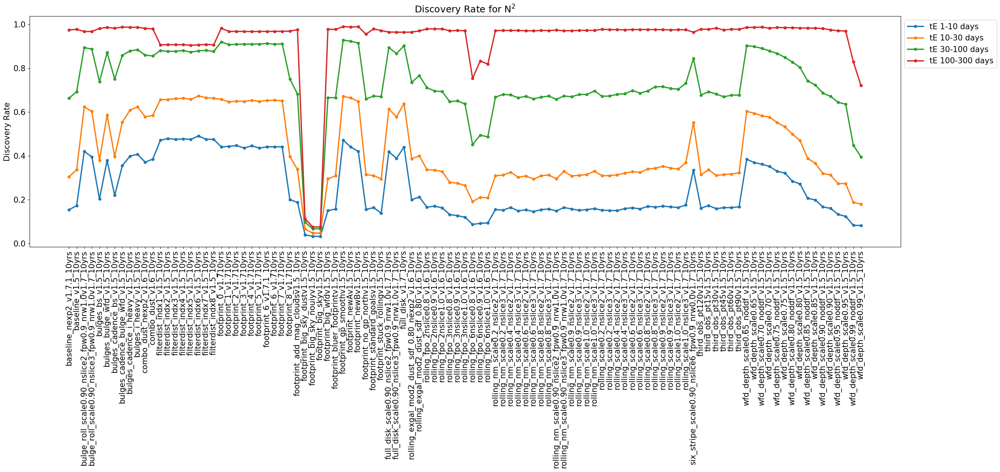

In [117]:
run_list_N2 = [tE_1_10_N2, tE_10_30_N2, tE_30_100_N2, tE_100_300_N2]
run_names_N2 = ['tE 1-10 days', 'tE 10-30 days', 'tE 30-100 days', 'tE 100-300 days']
split_value_N2 = ['fb_1']*4

discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, events_per_point = 10000, title_addition = 'for N$^2$')

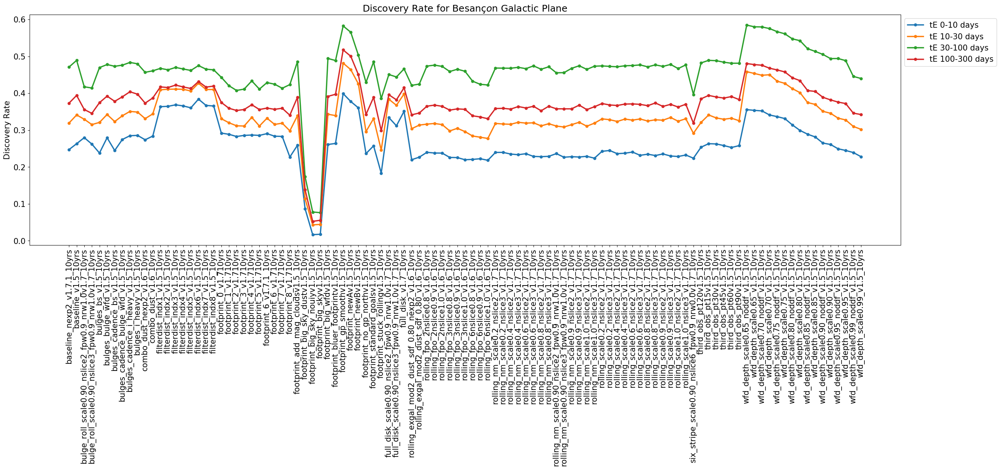

In [228]:
run_list_besancon = [tE_0_10_besancon, tE_10_30_besancon, tE_30_100_besancon, tE_100_300_besancon]
run_names_besancon = ['tE 0-10 days', 'tE 10-30 days', 'tE 30-100 days', 'tE 100-300 days']
split_value_besancon = ['0_10_', '10_30_', '30_100_', '100_300_']

discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n Galactic Plane')

In [88]:
def discovery_rate_hist_vertical(runs, run_names, split_value, events_per_point = 10000, plot_value = 'Discovery Rate', title_addition = '', fontsize = 15):
    """
    Plots the output of MicrolensingMetric OpSim which could be the discovery rate
    or the number of points within two einstein crossing times of the peak (2tE).
    This is plot vertically
    
    Inputs
    --------------
    runs - list
    This is a list of the pandas dfs that were important via load_in_microlensing_metric_db().
    
    run_names - list
    This is a list of strings that will be displayed in the legend.
    
    split_value - str (Optional)
    If there is a prefix before the name of the OpSim in the .db file, this is the last characters
    before the OpSim name for the first index of simulations in runs. If there are different 
    prefixes for each input folder from load_in_microlensing_metric_db(), this must be included.
    Default is None.
    
    events_per_point - int or float (Optional)
    Number of simulated microlensing events per OpSim run.
    Default is 10000.
    
    plot_value - str (Optional)
    Value plotted to be used in the title and axis label.
    Default is 'Discovery Rate'.
    
    title_addition - str (Optional)
    Any additional information to be added in the title.
    Default is ''.
    
    fontsize - int (Optional)
    Fontsize. Default is 15
    """
    plt.figure(figsize = (8,30))
    
    plt.rcdefaults()
    font = {'weight' : 'heavy',
            'size'   : 15}

    plt.rc('font', **font)
    
    alph_sort_run_0 = runs[0].sort_values('db').reset_index(drop = True)
    names = []
    for i in alph_sort_run_0['db']:
        if split_value == None:
            names.append(i)
        else:
            names.append(i.split(split_value)[1])

    for i in range(len(runs)):
        # sort runs alphabetically
        alph_sort_run = runs[i].sort_values('db').reset_index(drop = True)

        plt.plot(alph_sort_run[(1, 'MicrolensingMetric')]/events_per_point, names, label = run_names[i], marker = '.', markersize = 10, linewidth = 2.5)


    leg = plt.legend(bbox_to_anchor=(1, 1))
    plt.xlabel('{}'.format(plot_value))
    plt.title(r'{} {}'.format(plot_value, title_addition))
    
    plt.show()
    return

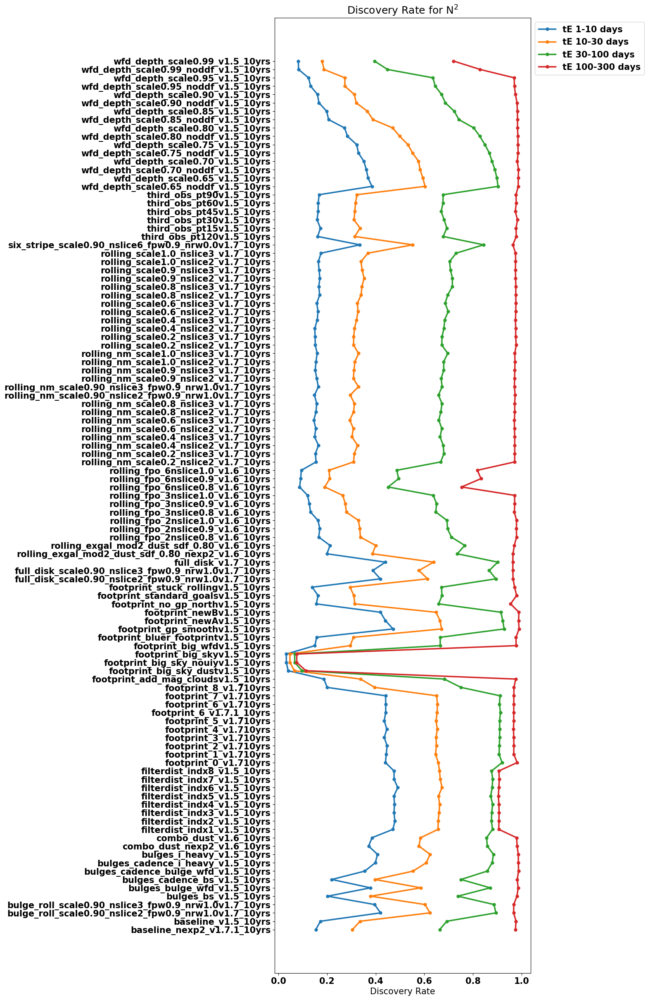

In [64]:
run_list_N2 = [tE_1_10_N2, tE_10_30_N2, tE_30_100_N2, tE_100_300_N2]
run_names_N2 = ['tE 1-10 days', 'tE 10-30 days', 'tE 30-100 days', 'tE 100-300 days']
split_value_N2 = 'fb_1'

discovery_rate_hist_vertical(run_list_N2, run_names_N2, split_value_N2, events_per_point = 10000, title_addition = 'for N$^2$')

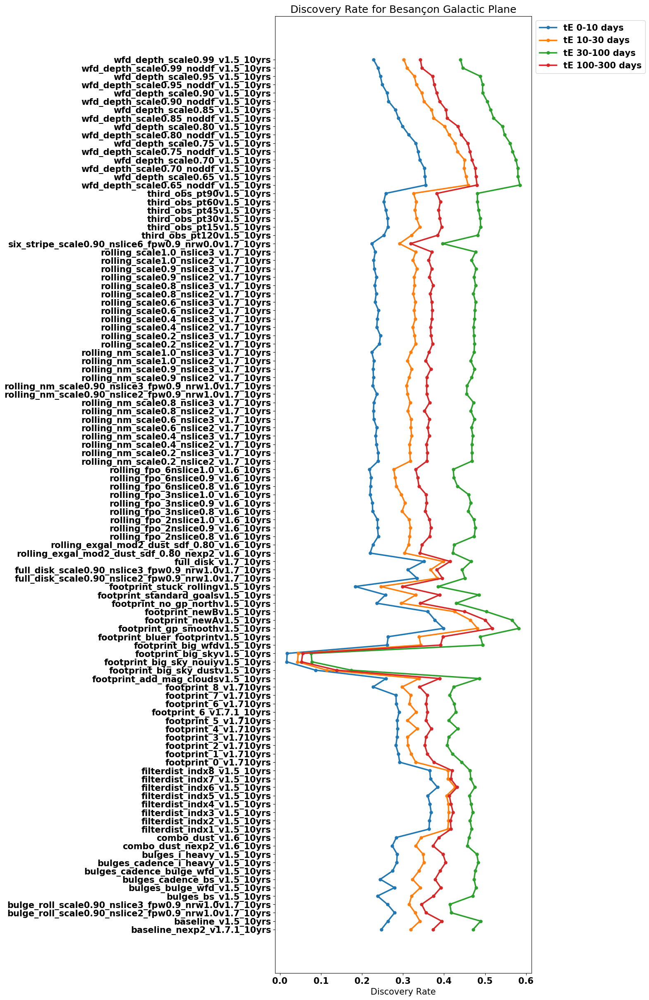

In [229]:
run_list_besancon = [tE_0_10_besancon, tE_10_30_besancon, tE_30_100_besancon, tE_100_300_besancon]
split_value_besancon_vert = '0_10_'

discovery_rate_hist_vertical(run_list_besancon, run_names_besancon, split_value_besancon_vert, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n Galactic Plane')

## Plot by family for $N^2$

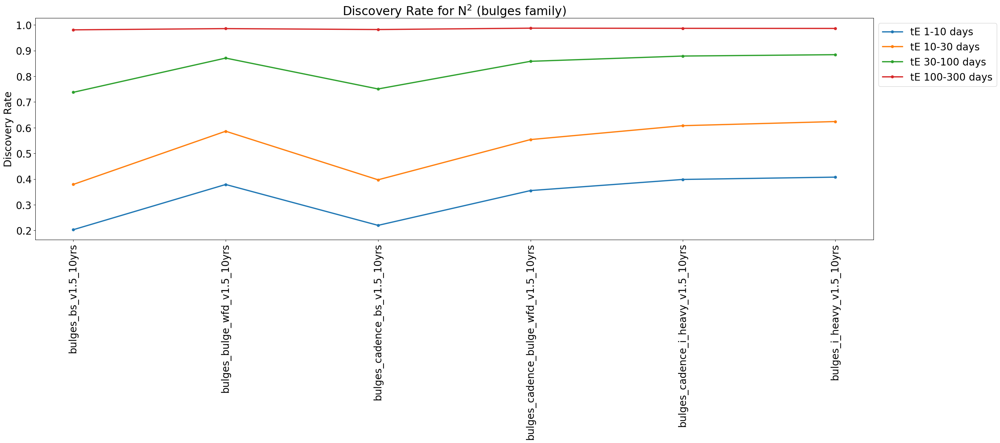

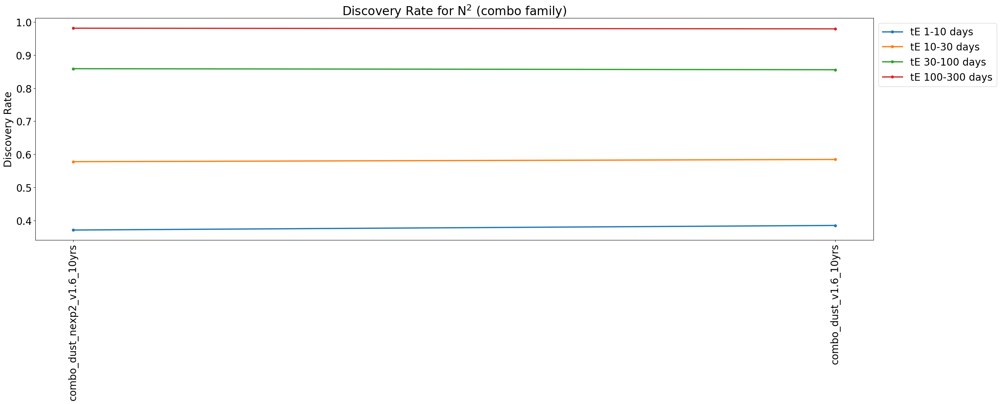

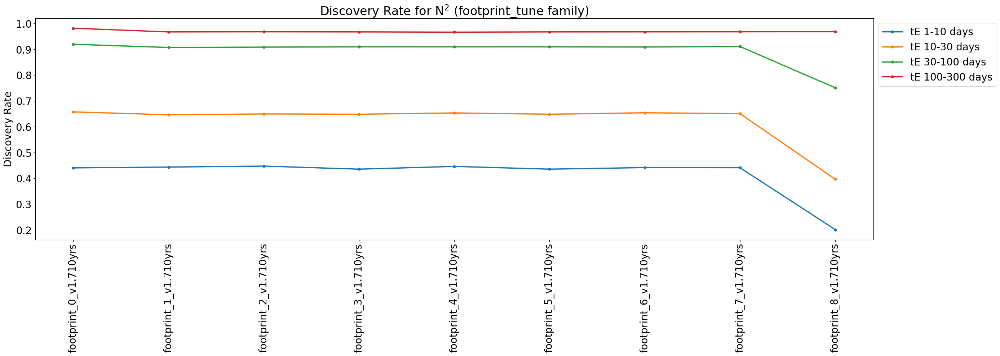

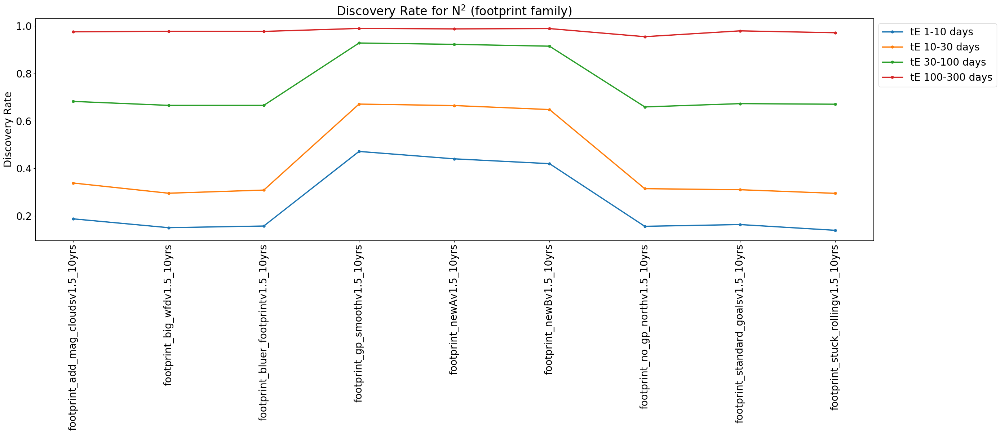

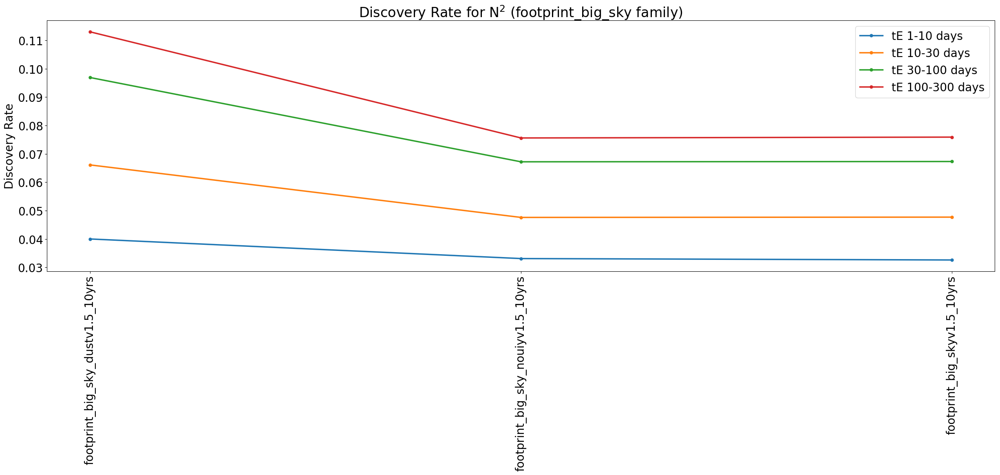

...

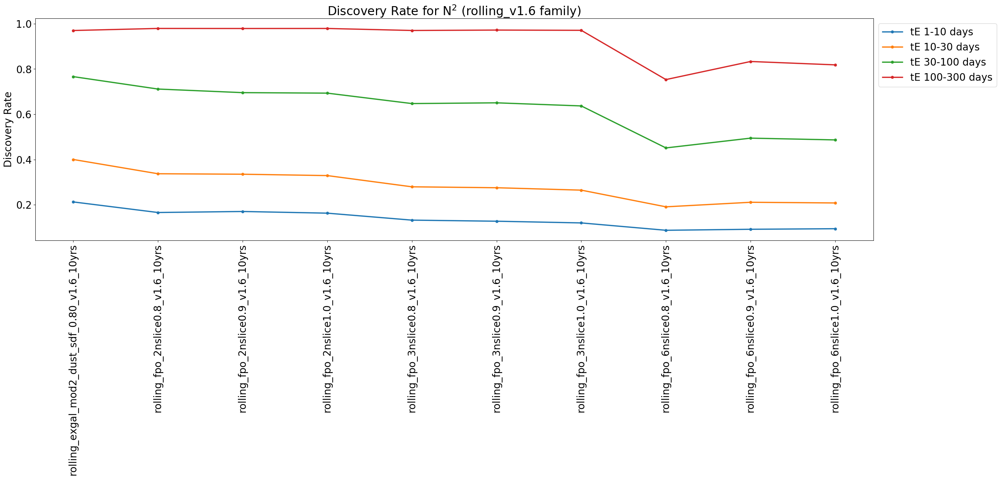

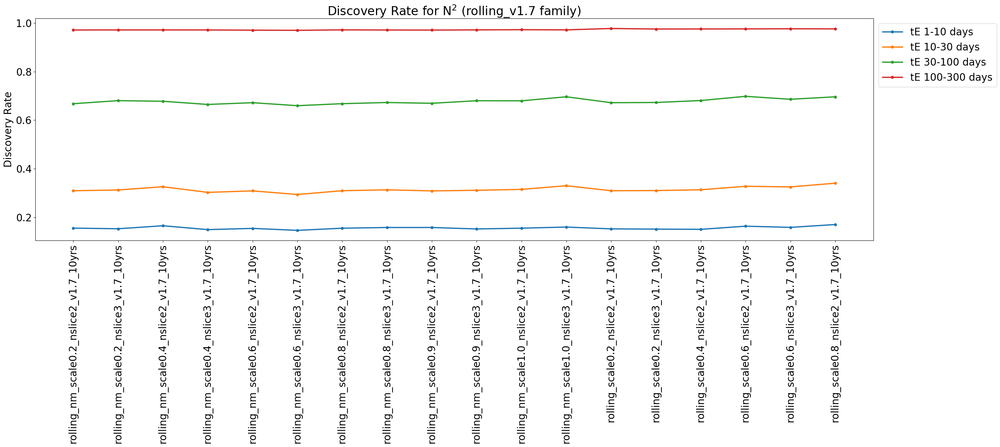

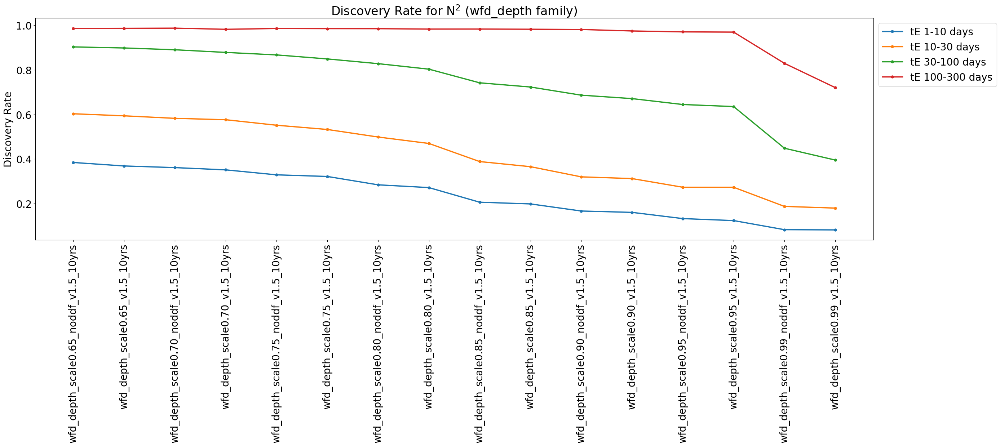

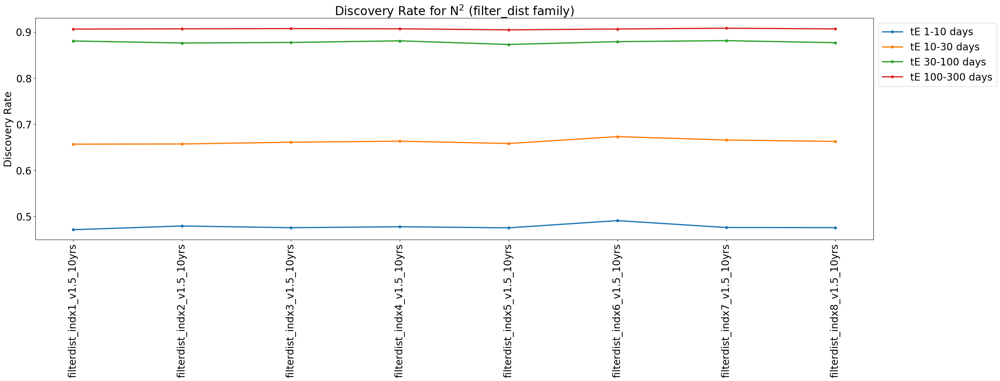

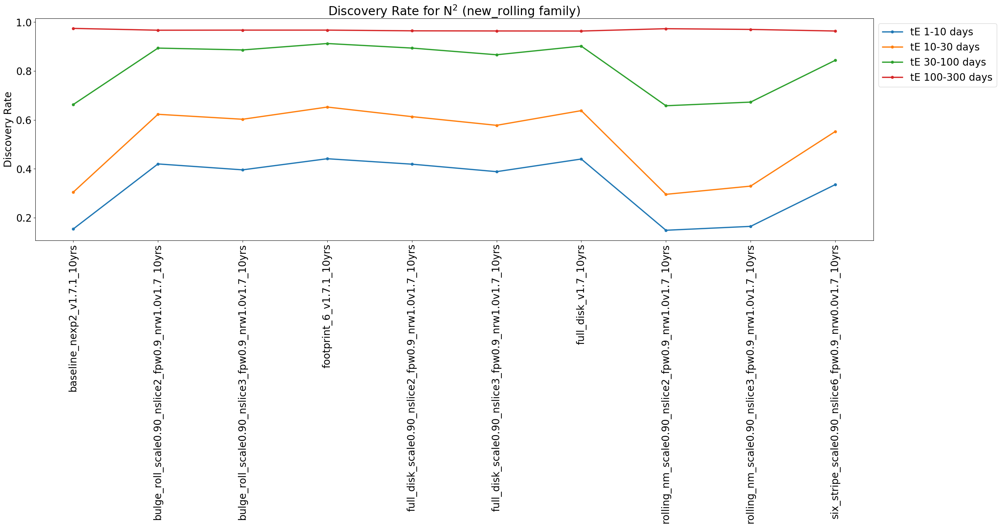

In [122]:
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = bulges, events_per_point = 10000, title_addition = 'for N$^2$ (bulges family)', fontsize = 20)
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = combo, events_per_point = 10000, title_addition = 'for N$^2$ (combo family)', fontsize = 20)
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = footprint_tune, events_per_point = 10000, title_addition = 'for N$^2$ (footprint_tune family)', fontsize = 20)
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = footprint, events_per_point = 10000, title_addition = 'for N$^2$ (footprint family)', fontsize = 20)
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = footprint_big_sky, events_per_point = 10000, title_addition = 'for N$^2$ (footprint_big_sky family)', fontsize = 20)
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = third_obs, events_per_point = 10000, title_addition = 'for N$^2$ (third_obs family)', fontsize = 20)
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = rolling_v16, events_per_point = 10000, title_addition = 'for N$^2$ (rolling_v1.6 family)', fontsize = 20)
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = rolling_v17, events_per_point = 10000, title_addition = 'for N$^2$ (rolling_v1.7 family)', fontsize = 20)
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = wfd_depth, events_per_point = 10000, title_addition = 'for N$^2$ (wfd_depth family)', fontsize = 20)
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = filter_dist, events_per_point = 10000, title_addition = 'for N$^2$ (filter_dist family)', fontsize = 20)
discovery_rate_hist(run_list_N2, run_names_N2, split_value_N2, family = new_rolling, events_per_point = 10000, title_addition = 'for N$^2$ (new_rolling family)', fontsize = 20)

## Plot by family for Besancon

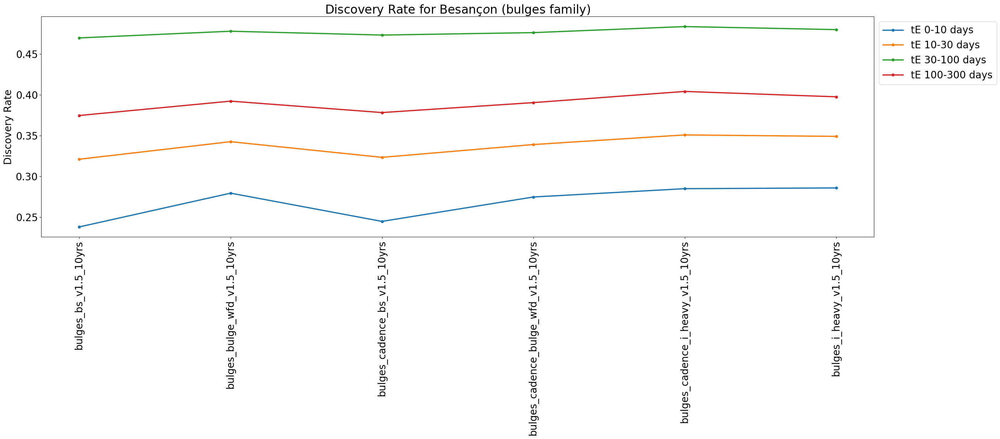

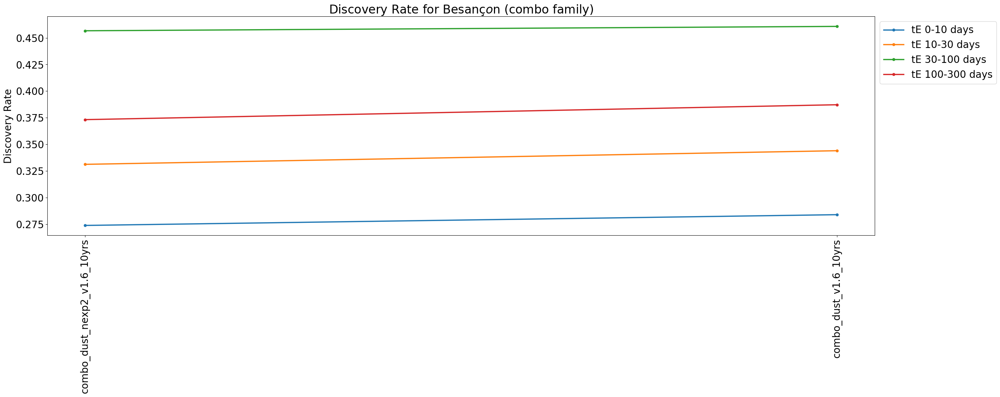

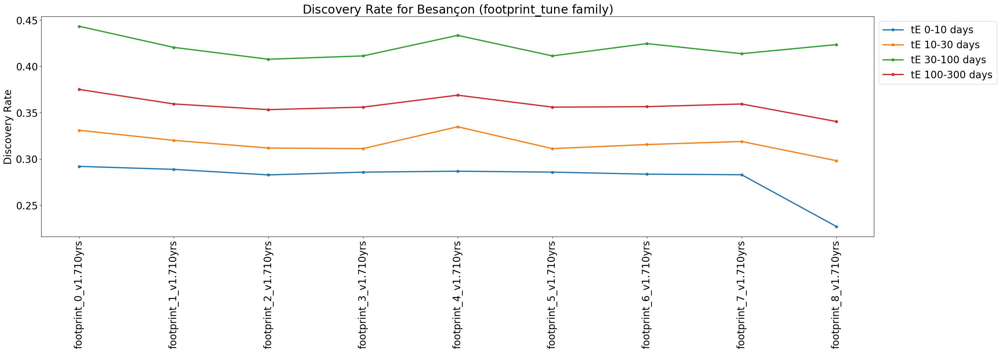

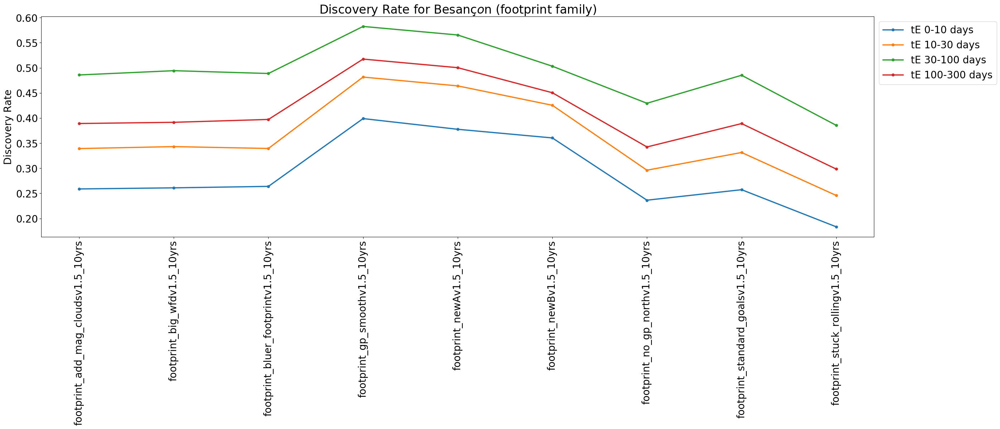

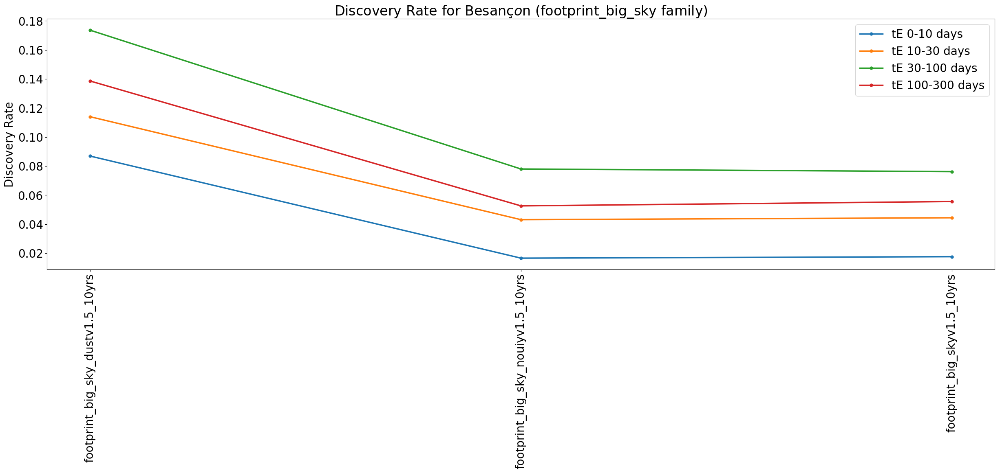

...

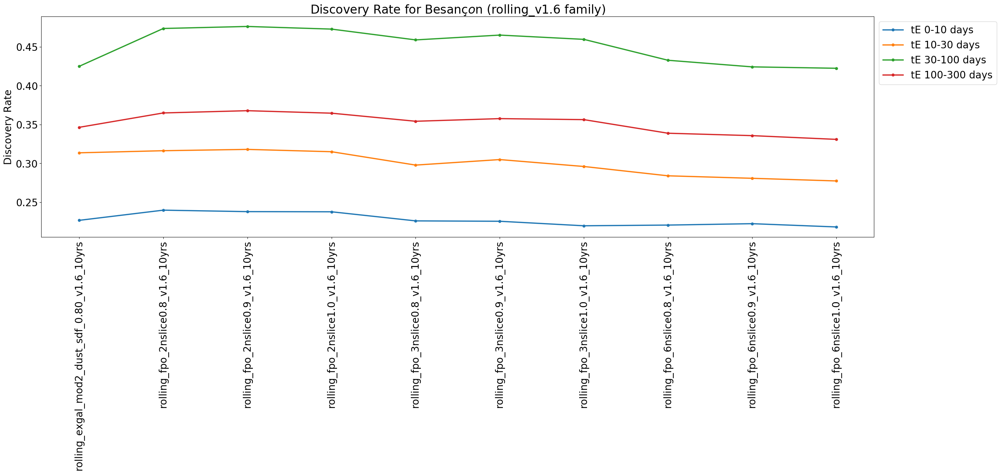

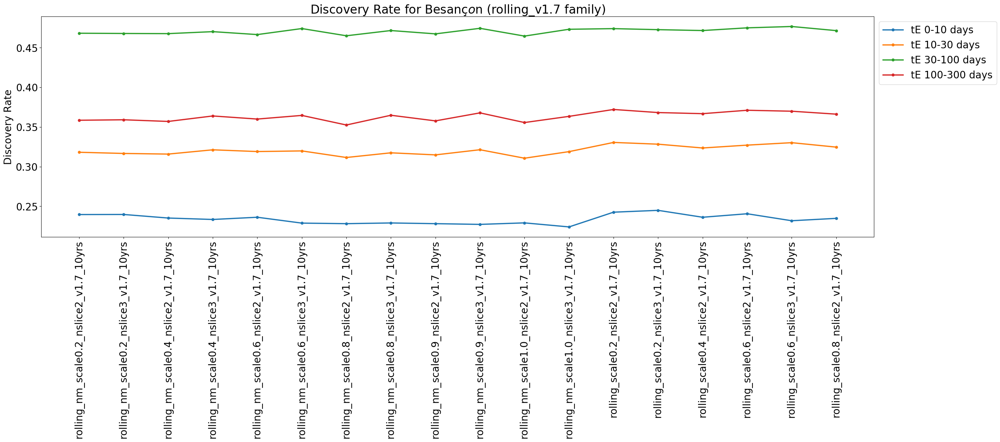

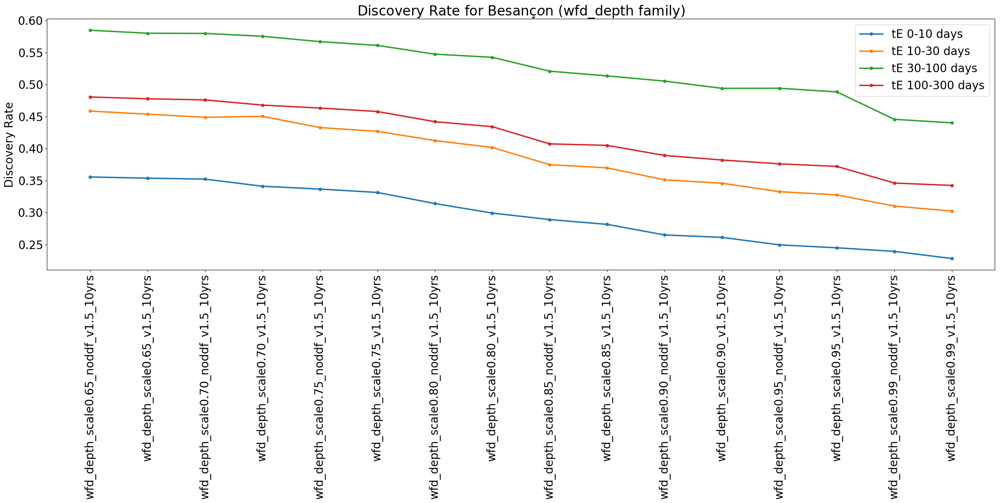

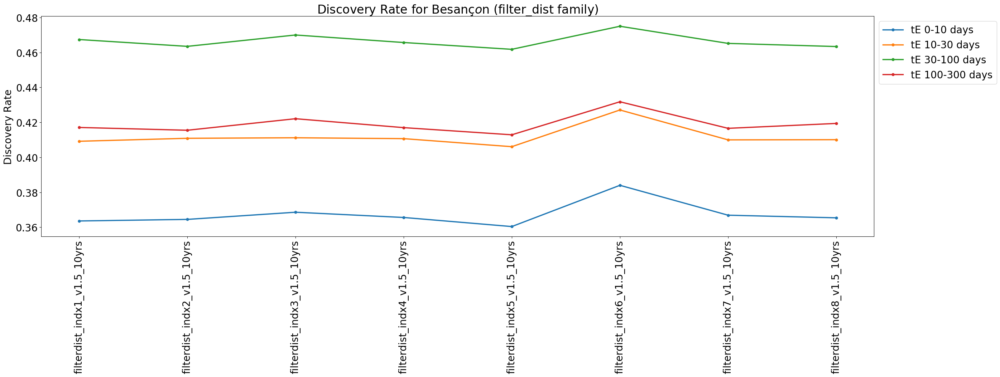

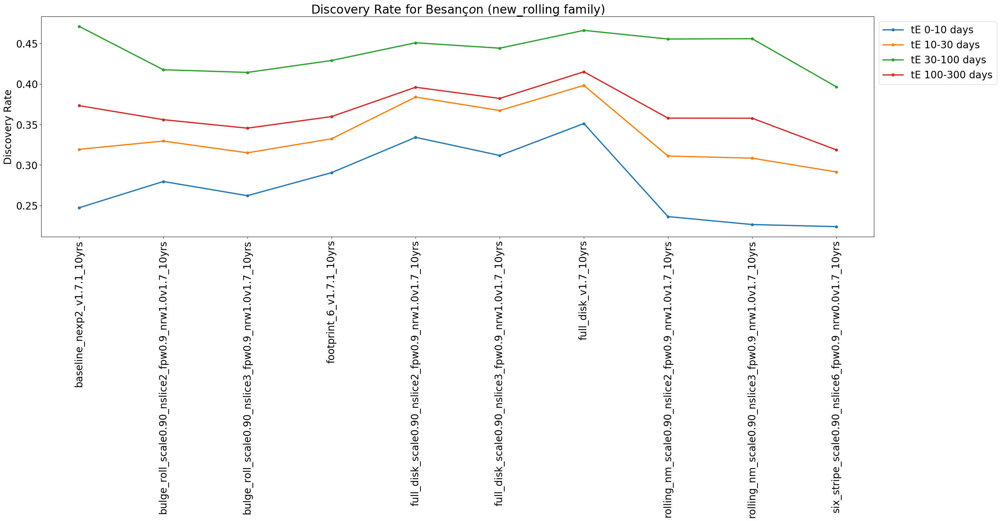

In [230]:
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = bulges, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (bulges family)', fontsize = 20)
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = combo, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (combo family)', fontsize = 20)
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = footprint_tune, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (footprint_tune family)', fontsize = 20)
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = footprint, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (footprint family)', fontsize = 20)
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = footprint_big_sky, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (footprint_big_sky family)', fontsize = 20)
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = third_obs, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (third_obs family)', fontsize = 20)
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = rolling_v16, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (rolling_v1.6 family)', fontsize = 20)
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = rolling_v17, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (rolling_v1.7 family)', fontsize = 20)
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = wfd_depth, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (wfd_depth family)', fontsize = 20)
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = filter_dist, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (filter_dist family)', fontsize = 20)
discovery_rate_hist(run_list_besancon, run_names_besancon, split_value_besancon, family = new_rolling, events_per_point = 10000, title_addition = 'for Besanc$\c{o}$n (new_rolling family)', fontsize = 20)

## Compare Discovery Rate to Percentage of the Galactic Plane Covered

In [188]:
# From Somayeh Khakpash (University of Deleware)
footprint_area_csv = pd.read_csv('GP_footprint_area.csv')

In [190]:
# These are particular chosen for runs where each symbol is for a family
footprint_symbol_list = ['o'] +['s']*2 + ['X']*6 + ['D']*2 + ['$f$'] + ['$m$'] + ['$b$']*4 + ['P']*7 + ['*']*3 + ['p']*2 + ['$s$'] + ['d']*8

In [200]:
def discovery_rate_vs_footprint(discovery_rate, footprint_area_csv, footprint_symbol_list, not_overlapped, mintE, maxtE, split_value, events_per_point = 10000, title_addition = ''):
    """
    Plots the output of MicrolensingMetric OpSim which could be the discovery rate
    or the number of points within two einstein crossing times of the peak (2tE).
    This is plot vertically
    
    Inputs
    --------------
    discovery_rate - df
    Dataframe made from load_in_microlensing_metric_db() where the MicrolensingMetric
    computed the discovery rate.
    
    footprint_area_csv - df
    Dataframe where the 4th row is the percentage of Galactic Plane with 600+ observations.
    
    fotprint_symbol_list - list
    List of marker symbols with length of overlap between discovery_rate and footprint_area_csv.
    
    not_overlapped - list
    List of OpSims included in footprint_area_csv than in discovery_rate.
    
    mintE - int or float
    Minimum tE drawn to compute db.
    
    maxtE - int or float
    Maximum tE drawn to compute db.
    
    split_value - str (Optional)
    If there is a prefix before the name of the OpSim in the .db file, this is the last characters
    before the OpSim name for the first index of simulations in runs. If there are different 
    prefixes for each input folder from load_in_microlensing_metric_db(), this must be included.
    Default is None.
    
    events_per_point - int or float (Optional)
    Number of simulated microlensing events per OpSim run.
    Default is 10000.
    
    title_addition - str (Optional)
    Any additional information to be added in the title.
    Default is ''.
    """
    footprint_list = []
    footprint = []
    for i in np.array(footprint_area_csv.columns)[1:]:
        if i not in not_overlapped:
            footprint_list.append(i)
            footprint.append(footprint_area_csv[i][4])
            
            
    matching_discovery_rate = []
    matching_discovery_rate_names = []

    for j in footprint_list:
        for i in discovery_rate.iterrows():
            i_check = i[1]['db'].split(split_value)[1]
            if i_check == j:
                matching_discovery_rate.append(i[1][1]/events_per_point)
                matching_discovery_rate_names.append(i_check)
                
    # Plot
    plt.rcdefaults()
    font = {'weight' : 'medium',
            'size'   : 15}

    plt.rc('font', **font)

    plt.figure(figsize = (10,15))
    
    plt.figure(figsize = (10,15))
    for i in range(len(footprint)):
        plt.plot(footprint[i], matching_discovery_rate[i], linestyle = 'none', markersize = 18, marker = footprint_symbol_list[i], label = matching_discovery_rate_names[i], alpha = 0.6)
    leg = plt.legend(bbox_to_anchor=(1, 1))

    plt.ylabel('Discovery Rate')
    plt.xlabel('Percentage of Galactic Plane With 600+ Observations')
    plt.title('$t_E$ {}-{} days - {}'.format(mintE, maxtE, title_addition))
                
    plt.show()
    return

<Figure size 1000x1500 with 0 Axes>

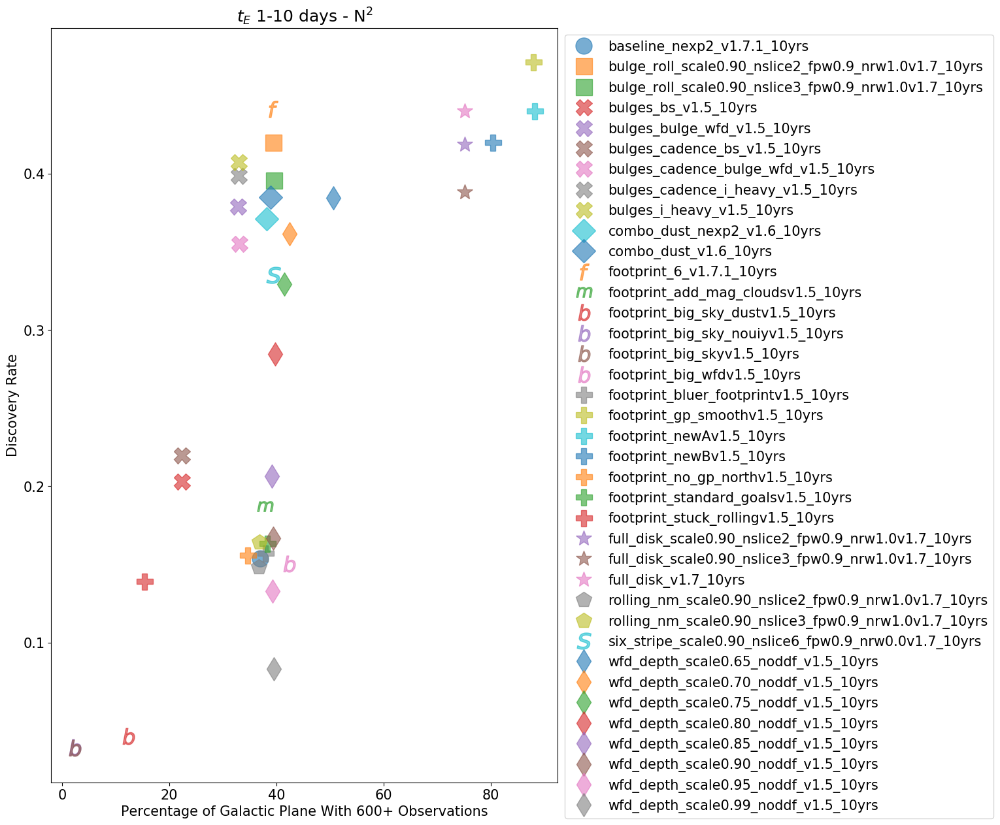

<Figure size 1000x1500 with 0 Axes>

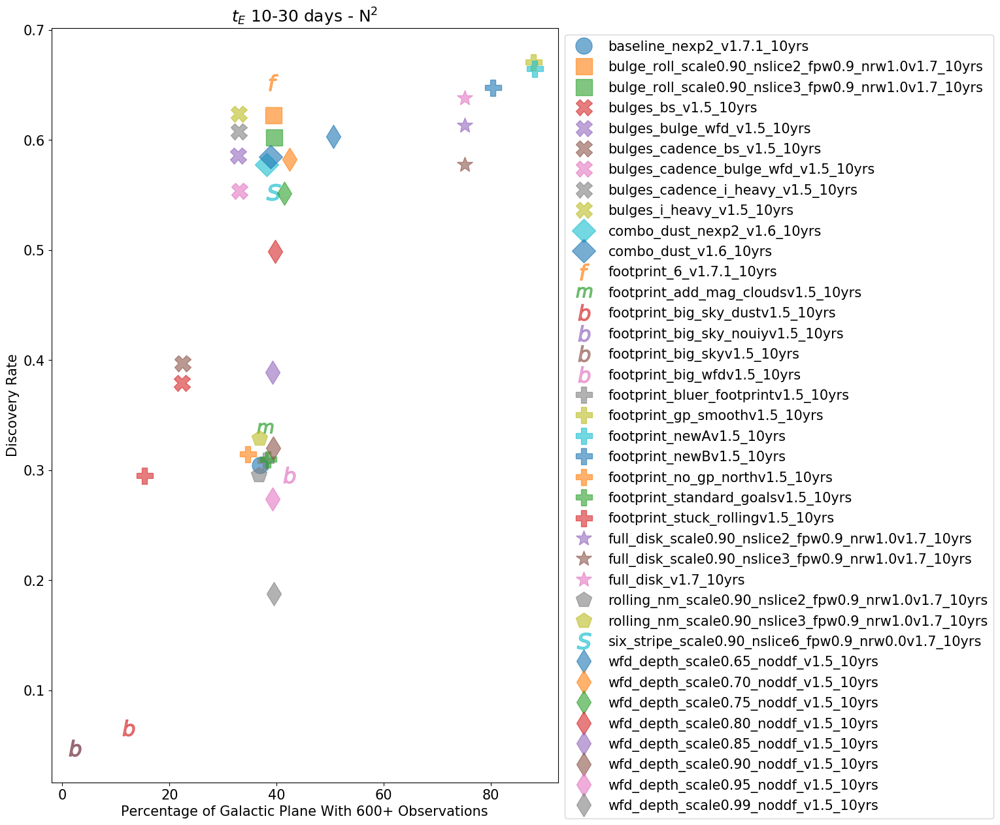

<Figure size 1000x1500 with 0 Axes>

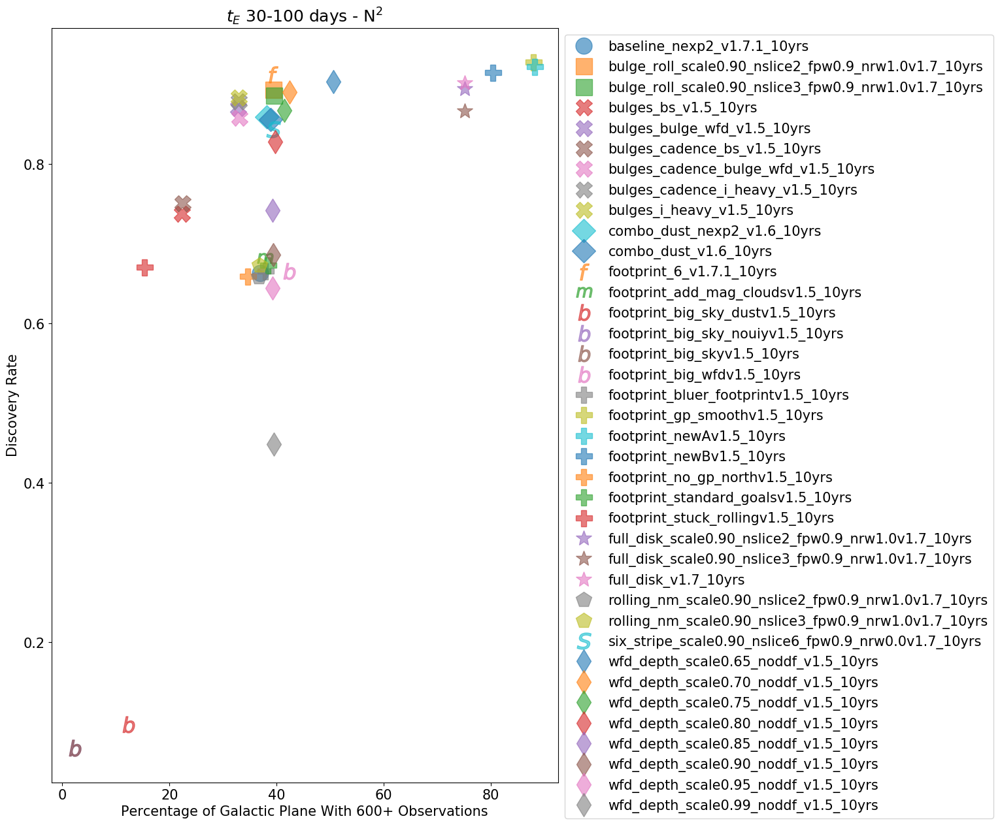

<Figure size 1000x1500 with 0 Axes>

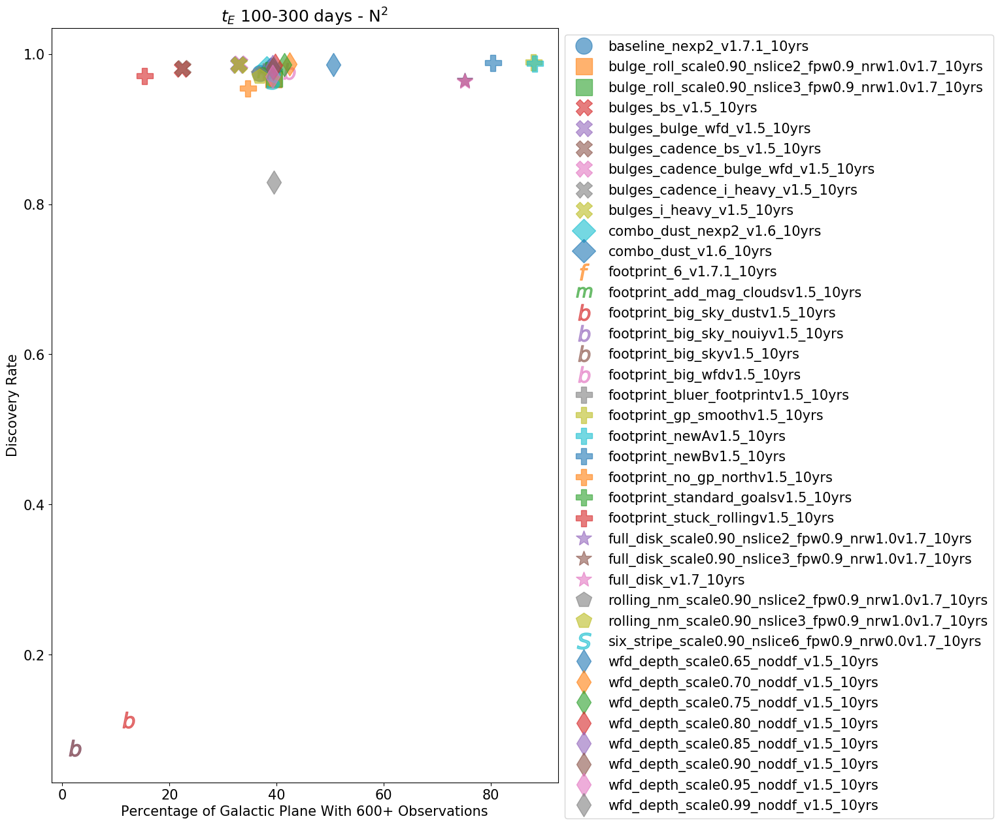

In [201]:
not_overlapped = ['baseline_nexp1_v1.7_10yrs', 'baseline_nexp2_v1.7_10yrs']
discovery_rate_vs_footprint(tE_1_10_N2, footprint_area_csv, footprint_symbol_list, not_overlapped, 1, 10, split_value = 'fb_1', events_per_point = 10000, title_addition = 'N$^2$')
discovery_rate_vs_footprint(tE_10_30_N2, footprint_area_csv, footprint_symbol_list, not_overlapped, 10, 30, split_value = 'fb_1', events_per_point = 10000, title_addition = 'N$^2$')
discovery_rate_vs_footprint(tE_30_100_N2, footprint_area_csv, footprint_symbol_list, not_overlapped, 30, 100, split_value = 'fb_1', events_per_point = 10000, title_addition = 'N$^2$')
discovery_rate_vs_footprint(tE_100_300_N2, footprint_area_csv, footprint_symbol_list, not_overlapped, 100, 300, split_value = 'fb_1', events_per_point = 10000, title_addition = 'N$^2$')


<Figure size 1000x1500 with 0 Axes>

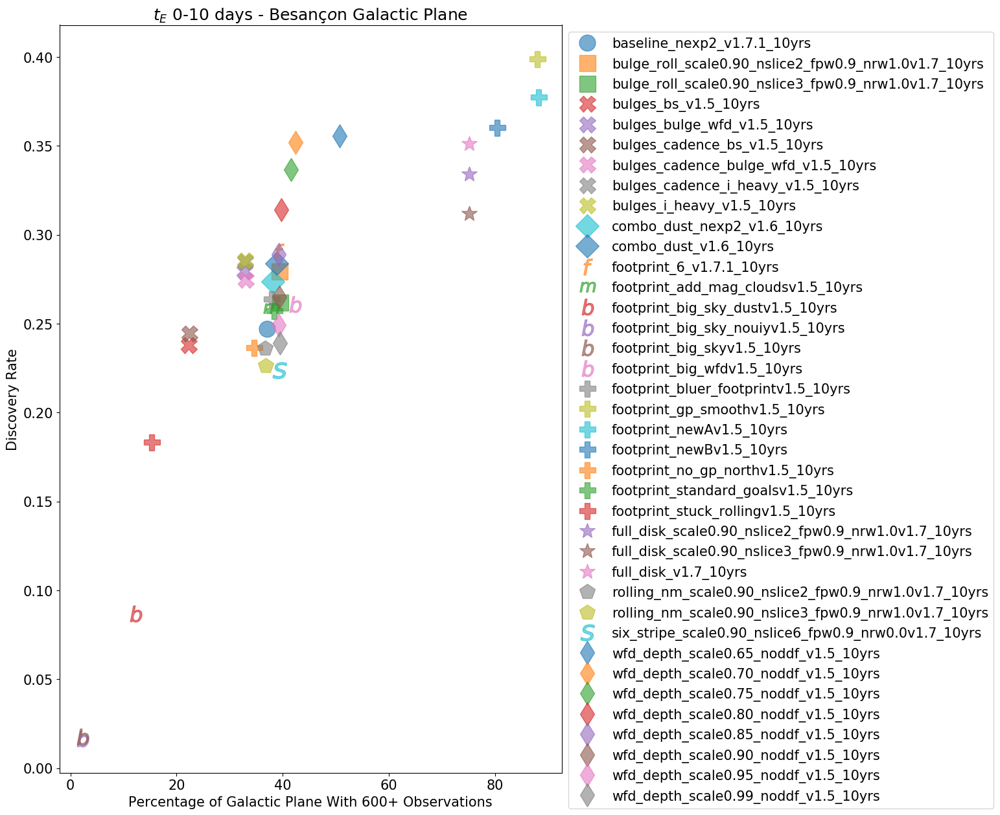

<Figure size 1000x1500 with 0 Axes>

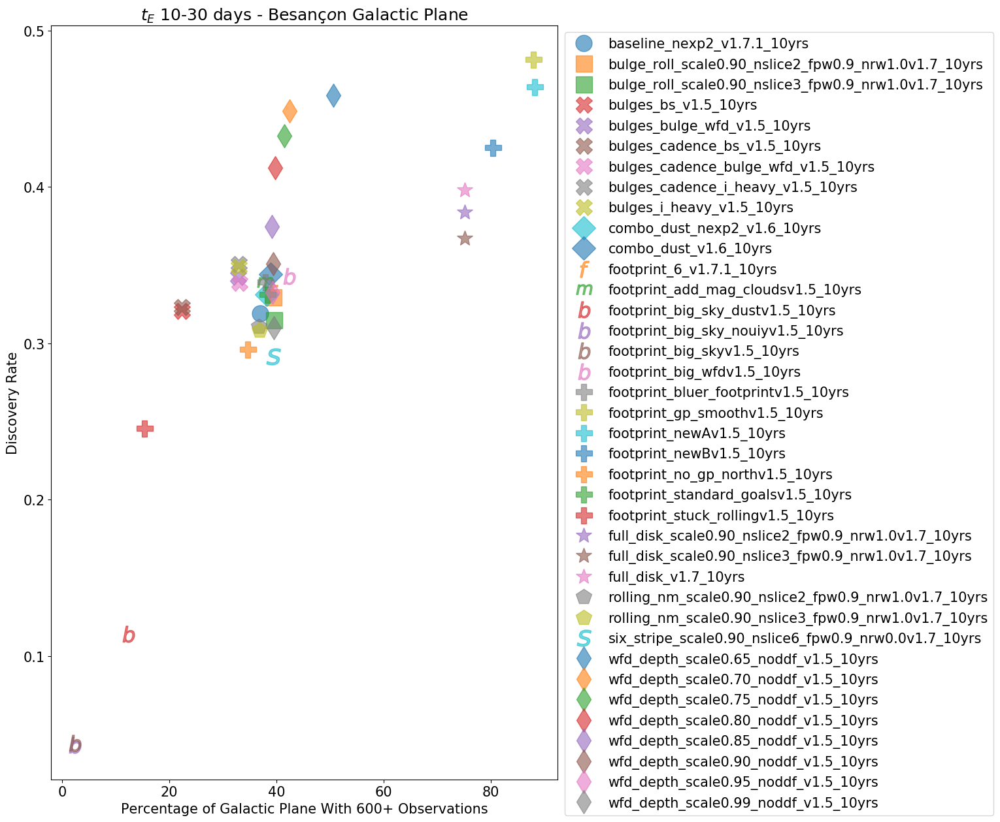

<Figure size 1000x1500 with 0 Axes>

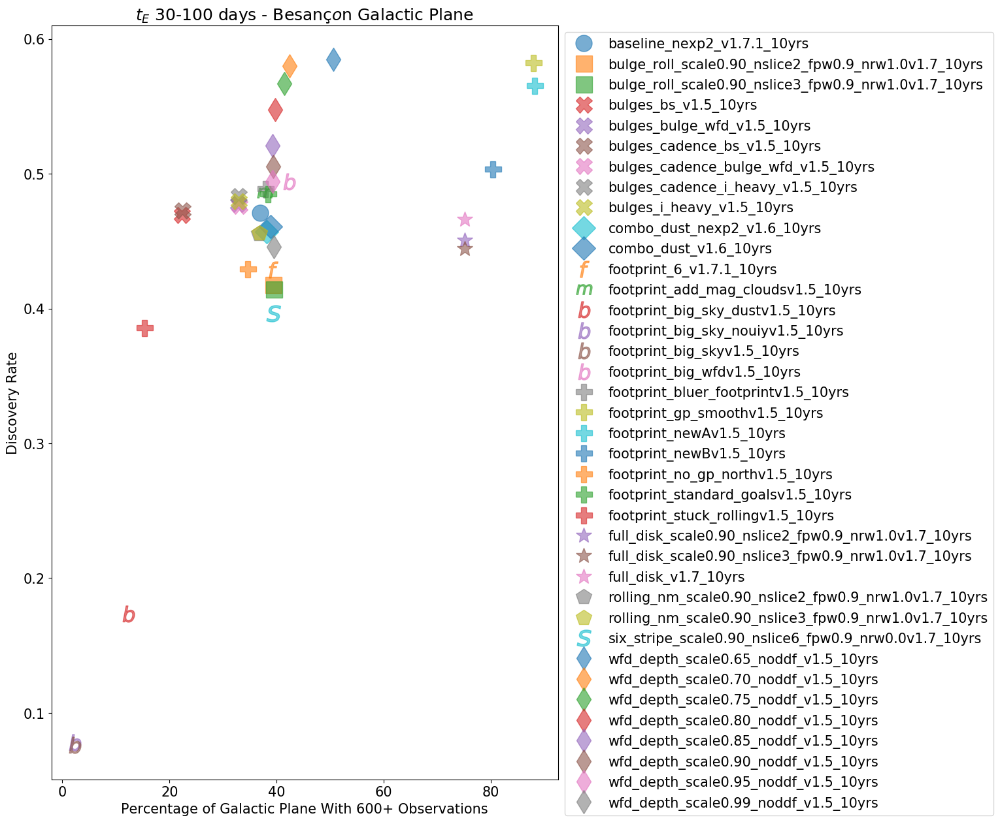

<Figure size 1000x1500 with 0 Axes>

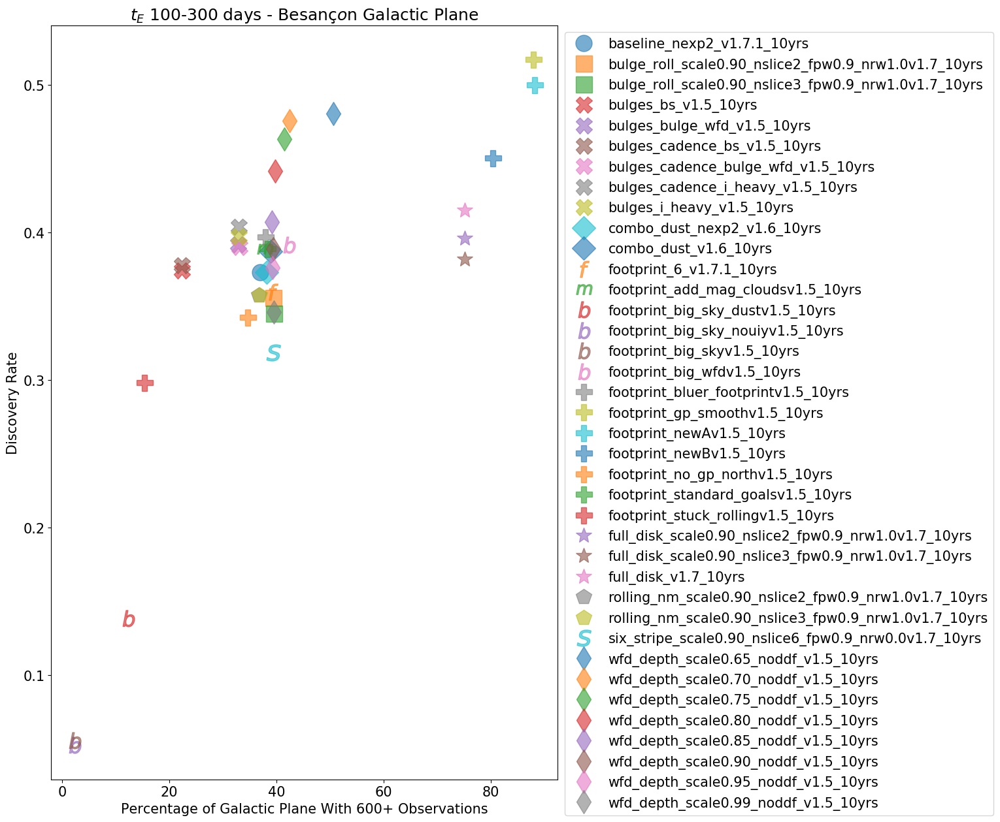

In [204]:
not_overlapped = ['baseline_nexp1_v1.7_10yrs', 'baseline_nexp2_v1.7_10yrs']
discovery_rate_vs_footprint(tE_0_10_besancon, footprint_area_csv, footprint_symbol_list, not_overlapped, 0, 10, split_value = '0_10_', events_per_point = 10000, title_addition = 'Besanc$\c{o}$n Galactic Plane')
discovery_rate_vs_footprint(tE_10_30_besancon, footprint_area_csv, footprint_symbol_list, not_overlapped, 10, 30, split_value = '10_30_', events_per_point = 10000, title_addition = 'Besanc$\c{o}$n Galactic Plane')
discovery_rate_vs_footprint(tE_30_100_besancon, footprint_area_csv, footprint_symbol_list, not_overlapped, 30, 100, split_value = '30_100_', events_per_point = 10000, title_addition = 'Besanc$\c{o}$n Galactic Plane')
discovery_rate_vs_footprint(tE_100_300_besancon, footprint_area_csv, footprint_symbol_list, not_overlapped, 100, 300, split_value = '100_300_', events_per_point = 10000, title_addition = 'Besanc$\c{o}$n Galactic Plane')


## Load in MicrolensingMetric Runs w/ Discovery Rate before 5 days before the event peak

In [206]:
tE_1_10_5_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_1-10_fb_1/5_day_b_peak')
tE_10_30_5_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_10-30_fb_1/5_day_b_peak')
tE_30_100_5_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_30-100_fb_1/5_day_b_peak')
tE_100_500_5_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_100-500_fb_1/5_day_b_peak')

Written FoM sums to path ./testFoMs.csv. Contents:
                                  runNames                                  ...
--------------------------------------------------------------------------- ...
MicrolensingMetric_5_b_peak_tE_1-10_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_5_b_peak_tE_1-10_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_5_b_peak_tE_1-10_fb_1bulges_bs_v1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                  runNames                                   ...
---------------------------------------------------------------------------- ...
MicrolensingMetric_5_b_peak_tE_10-30_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_5_b_peak_tE_10-30_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_5_b_peak_tE_10-30_fb_1bulges_bs_v1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                   runName

In [214]:
tE_0_10_5_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_0_10/5_day_b_peak')
tE_10_30_5_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_10_30/5_day_b_peak')
tE_30_100_5_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_30_100/5_day_b_peak')
tE_100_300_5_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_100_300/5_day_b_peak')

Written FoM sums to path ./testFoMs.csv. Contents:
                                runNames                                ...
----------------------------------------------------------------------- ...
MicrolensingMetric_5_b_peak_tE_0_10_bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_5_b_peak_tE_0_10_bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_5_b_peak_tE_0_10_bulges_bs_v1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                runNames                                 ...
------------------------------------------------------------------------ ...
MicrolensingMetric_5_b_peak_tE_10_30_bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_5_b_peak_tE_10_30_bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_5_b_peak_tE_10_30_bulges_bs_v1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                 runNames                                 ...
----

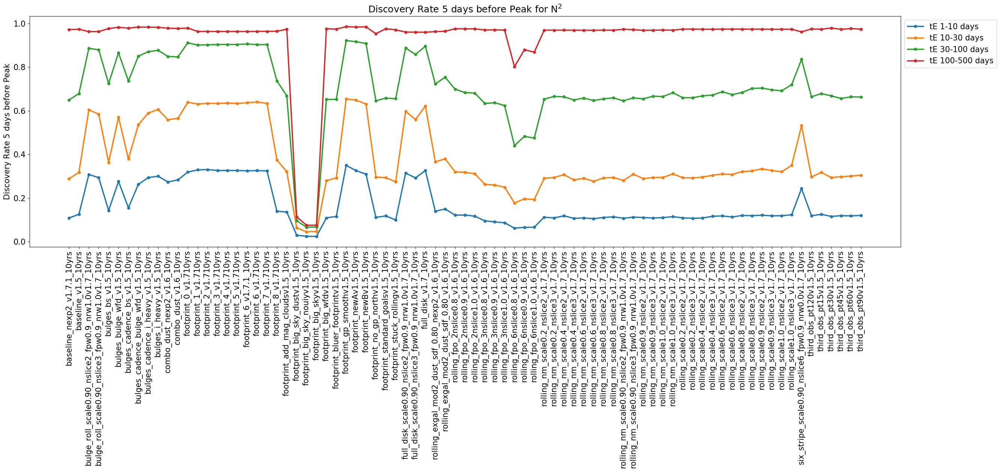

In [212]:
run_list_5_b_peak_N2 = [tE_1_10_5_b_peak_N2, tE_10_30_5_b_peak_N2, tE_30_100_5_b_peak_N2, tE_100_500_5_b_peak_N2]
run_names_b_peak_N2 = ['tE 1-10 days', 'tE 10-30 days', 'tE 30-100 days', 'tE 100-500 days']

discovery_rate_hist(run_list_5_b_peak_N2, run_names_b_peak_N2, split_value_N2, events_per_point = 10000, plot_value = 'Discovery Rate 5 days before Peak', title_addition = 'for N$^2$')

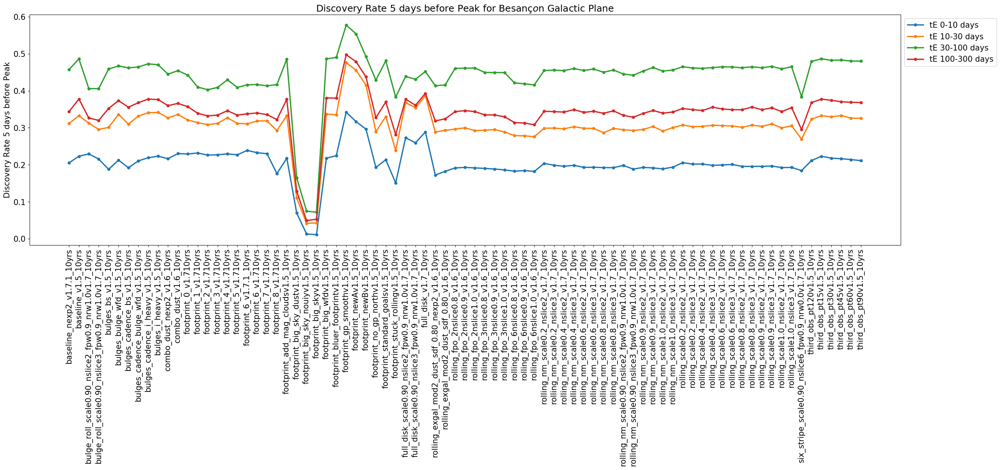

In [231]:
run_list_5_b_peak_besancon = [tE_0_10_5_b_peak_besancon, tE_10_30_5_b_peak_besancon, tE_30_100_5_b_peak_besancon, tE_100_300_5_b_peak_besancon]

discovery_rate_hist(run_list_5_b_peak_besancon, run_names_besancon, split_value_besancon, events_per_point = 10000, plot_value = 'Discovery Rate 5 days before Peak', title_addition = 'for Besanc$\c{o}$n Galactic Plane')

## Load in MicrolensingMetric Runs w/ Discovery Rate before 10 days before the event peak

In [216]:
tE_1_10_10_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_1-10_fb_1/10_day_b_peak')
tE_10_30_10_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_10-30_fb_1/10_day_b_peak')
tE_30_100_10_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_30-100_fb_1/10_day_b_peak')
tE_100_500_10_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_100-500_fb_1/10_day_b_peak')

Written FoM sums to path ./testFoMs.csv. Contents:
                                  runNames                                   ...
---------------------------------------------------------------------------- ...
MicrolensingMetric_10_b_peak_tE_1-10_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_10_b_peak_tE_1-10_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_10_b_peak_tE_1-10_fb_1bulges_bs_v1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                   runNames                                   ...
----------------------------------------------------------------------------- ...
MicrolensingMetric_10_b_peak_tE_10-30_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_10_b_peak_tE_10-30_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_10_b_peak_tE_10-30_fb_1bulges_bs_v1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                

In [217]:
tE_0_10_10_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_0_10/10_day_b_peak')
tE_10_30_10_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_10_30/10_day_b_peak')
tE_30_100_10_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_30_100/10_day_b_peak')
tE_100_300_10_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_100_300/10_day_b_peak')

Written FoM sums to path ./testFoMs.csv. Contents:
                               runNames                                ...
---------------------------------------------------------------------- ...
      MicrolensingMetric_10_b_peak_tE_0_10_footprint_big_skyv1.5_10yrs ...
         MicrolensingMetric_10_b_peak_tE_0_10_footprint_newBv1.5_10yrs ...
MicrolensingMetric_10_b_peak_tE_0_10_footprint_big_sky_nouiyv1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                runNames                                ...
----------------------------------------------------------------------- ...
      MicrolensingMetric_10_b_peak_tE_10_30_footprint_big_skyv1.5_10yrs ...
         MicrolensingMetric_10_b_peak_tE_10_30_footprint_newBv1.5_10yrs ...
MicrolensingMetric_10_b_peak_tE_10_30_footprint_big_sky_nouiyv1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                runNames                                 ...
---------------

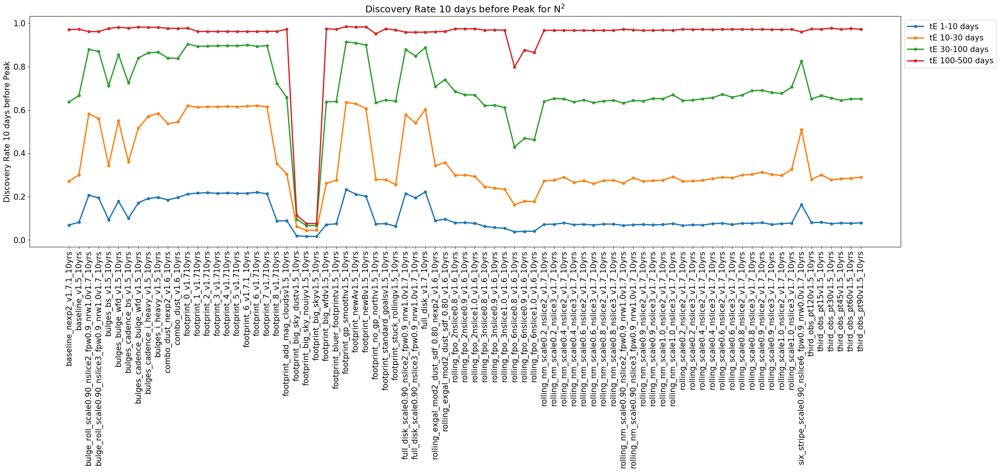

In [218]:
run_list_10_b_peak_N2 = [tE_1_10_10_b_peak_N2, tE_10_30_10_b_peak_N2, tE_30_100_10_b_peak_N2, tE_100_500_10_b_peak_N2]
run_names_b_peak_N2 = ['tE 1-10 days', 'tE 10-30 days', 'tE 30-100 days', 'tE 100-500 days']

discovery_rate_hist(run_list_10_b_peak_N2, run_names_b_peak_N2, split_value_N2, events_per_point = 10000, plot_value = 'Discovery Rate 10 days before Peak', title_addition = 'for N$^2$')

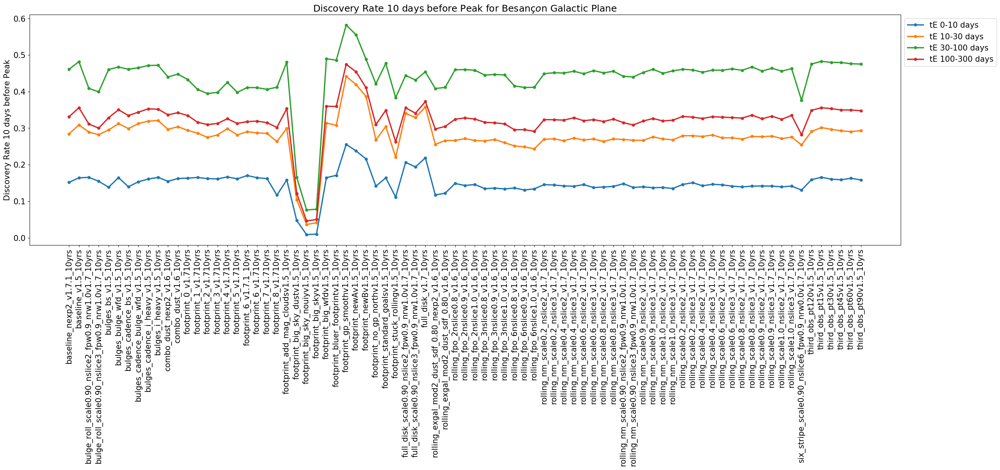

In [232]:
run_list_10_b_peak_besancon = [tE_0_10_10_b_peak_besancon, tE_10_30_10_b_peak_besancon, tE_30_100_10_b_peak_besancon, tE_100_300_10_b_peak_besancon]

discovery_rate_hist(run_list_10_b_peak_besancon, run_names_besancon, split_value_besancon, events_per_point = 10000, plot_value = 'Discovery Rate 10 days before Peak', title_addition = 'for Besanc$\c{o}$n Galactic Plane')

## Load in MicrolensingMetric Runs w/ Discovery Rate before Maximum Info before the event peak

Via Markus Hundertmark (University of Heidelberg)
$\Delta t = \pm t_{\rm E} \sqrt{- u_{0}^{2} - \sqrt{9 u_{0}^{4} + 36 u_{0}^{2} + 4} - 2}/2$

In [220]:
tE_1_10_optimal_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_1-10_fb_1/optimal_b_peak')
tE_10_30_optimal_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_10-30_fb_1/optimal_b_peak')
tE_30_100_optimal_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_30-100_fb_1/optimal_b_peak')
tE_100_500_optimal_b_peak_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_100-500_fb_1/optimal_b_peak')

Written FoM sums to path ./testFoMs.csv. Contents:
                                     runNames                                     ...
--------------------------------------------------------------------------------- ...
MicrolensingMetric_optimal_b_peak_tE_1-10_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_optimal_b_peak_tE_1-10_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_optimal_b_peak_tE_1-10_fb_1bulges_bs_v1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                     runNames                                      ...
---------------------------------------------------------------------------------- ...
MicrolensingMetric_optimal_b_peak_tE_10-30_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_optimal_b_peak_tE_10-30_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_optimal_b_peak_tE_10-30_fb_1bulges_bs_v1.5_10yrs ...
Written FoM sums to path ./testFo

In [221]:
tE_0_10_optimal_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_0_10/optimal_b_peak')
tE_10_30_optimal_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_10_30/optimal_b_peak')
tE_30_100_optimal_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_30_100/optimal_b_peak')
tE_100_300_optimal_b_peak_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_100_300/optimal_b_peak')

Written FoM sums to path ./testFoMs.csv. Contents:
                                  runNames                                   ...
---------------------------------------------------------------------------- ...
MicrolensingMetric_optimal_b_peak_tE_0_10bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_optimal_b_peak_tE_0_10bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_optimal_b_peak_tE_0_10bulges_bs_v1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                   runNames                                   ...
----------------------------------------------------------------------------- ...
MicrolensingMetric_optimal_b_peak_tE_10_30bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_optimal_b_peak_tE_10_30bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_optimal_b_peak_tE_10_30bulges_bs_v1.5_10yrs ...
Written FoM sums to path ./testFoMs.csv. Contents:
                                

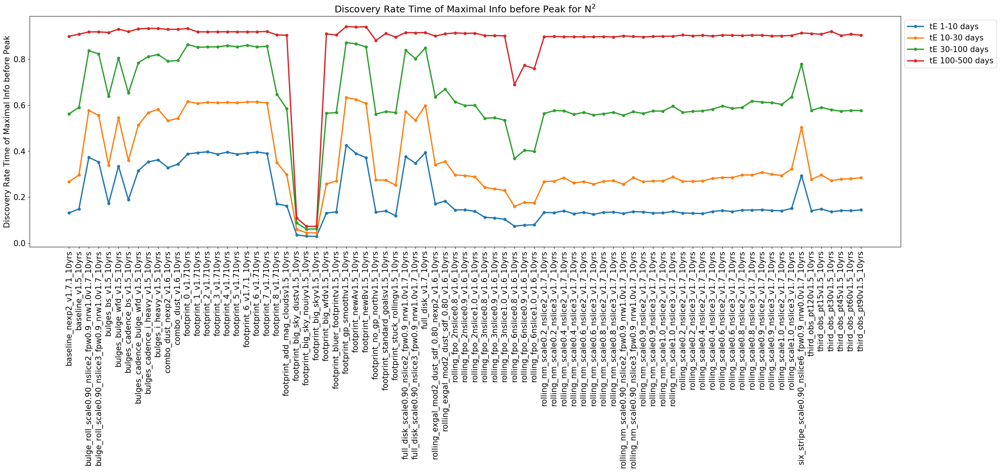

In [222]:
run_list_optimal_b_peak_N2 = [tE_1_10_optimal_b_peak_N2, tE_10_30_optimal_b_peak_N2, tE_30_100_optimal_b_peak_N2, tE_100_500_optimal_b_peak_N2]

discovery_rate_hist(run_list_optimal_b_peak_N2, run_names_b_peak_N2, split_value_N2, events_per_point = 10000, plot_value = 'Discovery Rate Time of Maximal Info before Peak', title_addition = 'for N$^2$')

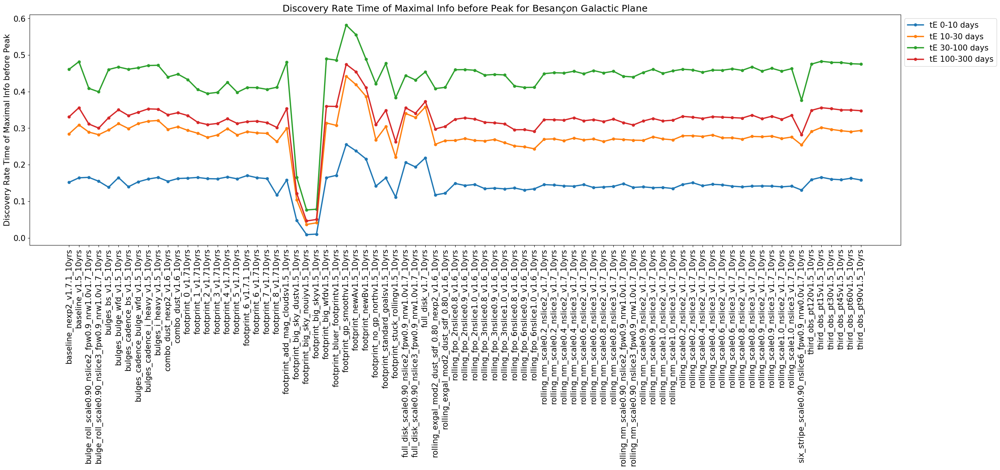

In [233]:
run_list_optimal_b_peak_besancon = [tE_0_10_optimal_b_peak_besancon, tE_10_30_optimal_b_peak_besancon, tE_30_100_optimal_b_peak_besancon, tE_100_300_optimal_b_peak_besancon]

discovery_rate_hist(run_list_10_b_peak_besancon, run_names_besancon, split_value_besancon, events_per_point = 10000, plot_value = 'Discovery Rate Time of Maximal Info before Peak', title_addition = 'for Besanc$\c{o}$n Galactic Plane')

Text(0.5, 1.0, 'Discovery Rate before peak trigger N$^2$')

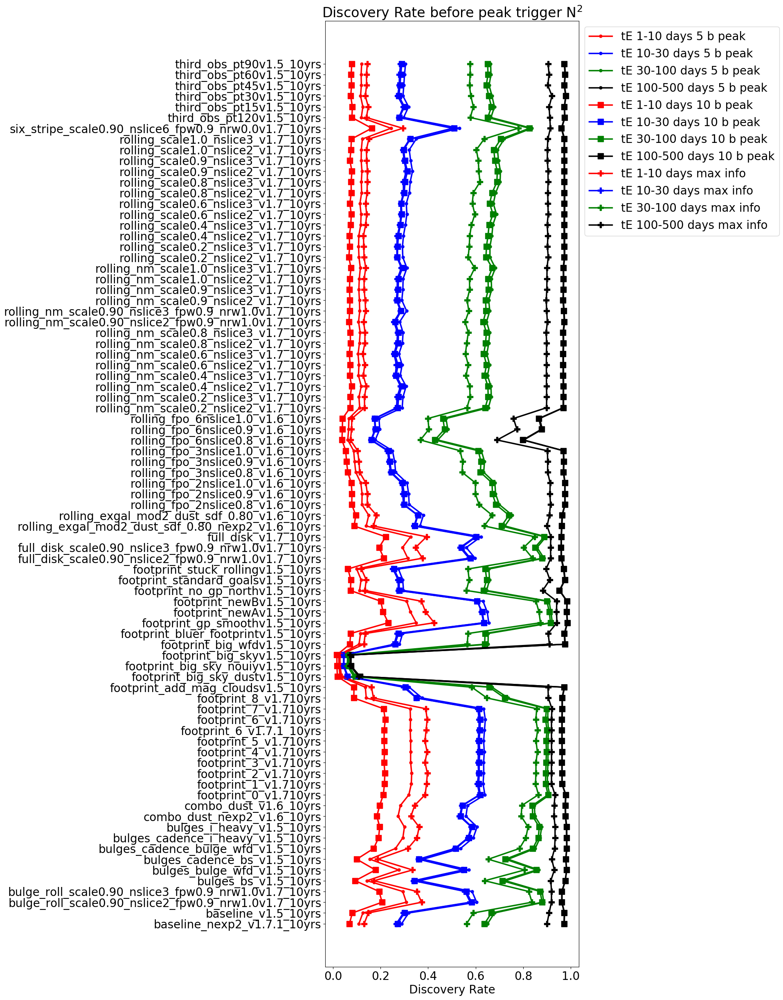

In [224]:
plt.figure(figsize = (8,30))

plt.rcdefaults()
font = {'weight' : 'medium',
        'size'   : 20}

plt.rc('font', **font)

run_list_together_b_peak = run_list_5_b_peak_N2  + run_list_10_b_peak_N2  + run_list_optimal_b_peak_N2 

time_run_names = ['tE 1-10 days 5 b peak', 'tE 10-30 days 5 b peak', 'tE 30-100 days 5 b peak', 'tE 100-500 days 5 b peak',
                 'tE 1-10 days 10 b peak', 'tE 10-30 days 10 b peak', 'tE 30-100 days 10 b peak', 'tE 100-500 days 10 b peak',
                 'tE 1-10 days max info', 'tE 10-30 days max info', 'tE 30-100 days max info', 'tE 100-500 days max info']
colorlist = ['r', 'b', 'g', 'k', 'r', 'b', 'g', 'k', 'r', 'b', 'g', 'k']
markerlist = ['.', '.', '.', '.', 's', 's', 's', 's', 'P', 'P', 'P', 'P']



events_per_point = 10000

alph_sort_run_0 = run_list_together_b_peak[0].sort_values('db').reset_index(drop = True)
names = []
for i in alph_sort_run_0['db']:
    names.append(i.split('fb_1')[1])

for i in range(len(run_list_together_b_peak)):
    alph_sort_run = run_list_together_b_peak[i].sort_values('db').reset_index(drop = True)
    plt.plot(alph_sort_run[(1, 'MicrolensingMetric')]/events_per_point, names, label = time_run_names[i], marker = markerlist[i], markersize = 10, linewidth = 2.5, color = colorlist[i])
    

leg = plt.legend(bbox_to_anchor=(1, 1))

plt.xlabel('Discovery Rate')
plt.title('Discovery Rate before peak trigger N$^2$')


Text(0.5, 1.0, 'Discovery Rate before peak Besanc$\\c{o}$n Galactic Plane')

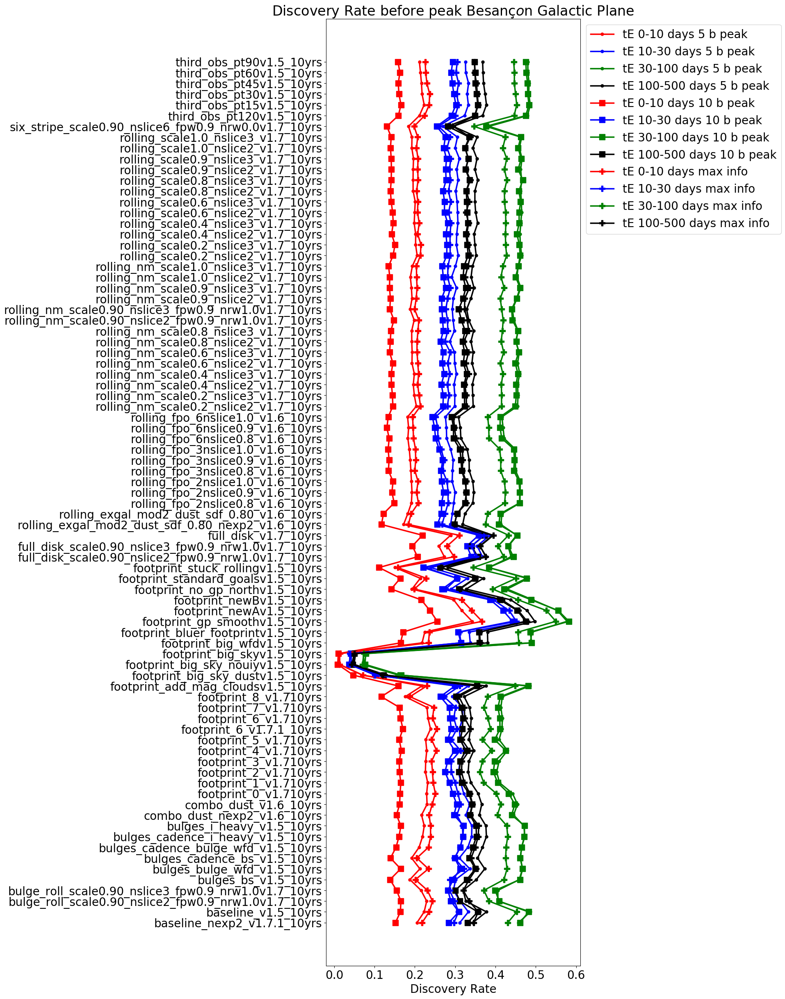

In [234]:
plt.figure(figsize = (8,30))

plt.rcdefaults()
font = {'weight' : 'medium',
        'size'   : 20}

plt.rc('font', **font)


colorlist = ['r', 'b', 'g', 'k', 'r', 'b', 'g', 'k', 'r', 'b', 'g', 'k']
markerlist = ['.', '.', '.', '.', 's', 's', 's', 's', 'P', 'P', 'P', 'P']

run_list_together_peak_besancon =run_list_5_b_peak_besancon+ run_list_10_b_peak_besancon + run_list_optimal_b_peak_besancon

time_run_names = ['tE 0-10 days 5 b peak', 'tE 10-30 days 5 b peak', 'tE 30-100 days 5 b peak', 'tE 100-500 days 5 b peak',
                 'tE 0-10 days 10 b peak', 'tE 10-30 days 10 b peak', 'tE 30-100 days 10 b peak', 'tE 100-500 days 10 b peak',
                 'tE 0-10 days max info', 'tE 10-30 days max info', 'tE 30-100 days max info', 'tE 100-500 days max info']

events_per_point = 10000

alph_sort_run_0 = run_list_together_peak_besancon[0].sort_values('db').reset_index(drop = True)
names = []
for i in alph_sort_run_0['db']:
    names.append(i.split('0_10_')[1])


for i in range(len(run_list_together_peak_besancon)):
    alph_sort_run = run_list_together_peak_besancon[i].sort_values('db').reset_index(drop = True)
    plt.plot(alph_sort_run[(1, 'MicrolensingMetric')]/events_per_point, names, label = time_run_names[i], marker = markerlist[i], markersize = 10, linewidth = 2.5, color = colorlist[i])
    

leg = plt.legend(bbox_to_anchor=(1, 1))

plt.xlabel('Discovery Rate')
plt.title('Discovery Rate before peak Besanc$\c{o}$n Galactic Plane')


## Load in MicrolensingMetric Runs w/ Npts between 2tE from peak time

In [125]:
tE_1_10_Npts_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_1-10_fb_1/Npts')

Written FoM sums to path ./testFoMs.csv. Contents:
                                runNames                                ...
----------------------------------------------------------------------- ...
MicrolensingMetric_Npts_tE_1-10_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_Npts_tE_1-10_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_Npts_tE_1-10_fb_1bulges_bs_v1.5_10yrs ...


In [126]:
tE_10_30_Npts_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_10-30_fb_1/Npts')

Written FoM sums to path ./testFoMs.csv. Contents:
                                runNames                                 ...
------------------------------------------------------------------------ ...
MicrolensingMetric_Npts_tE_10-30_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_Npts_tE_10-30_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_Npts_tE_10-30_fb_1bulges_bs_v1.5_10yrs ...


In [127]:
tE_30_100_Npts_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_30-100_fb_1/Npts')

Written FoM sums to path ./testFoMs.csv. Contents:
                                 runNames                                 ...
------------------------------------------------------------------------- ...
MicrolensingMetric_Npts_tE_30-100_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_Npts_tE_30-100_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_Npts_tE_30-100_fb_1bulges_bs_v1.5_10yrs ...


In [128]:
tE_100_300_Npts_N2 = load_in_microlensing_metric_db('LSST_Hackathon/simple_runs_output/tE_100-300_fb_1/Npts')

Written FoM sums to path ./testFoMs.csv. Contents:
                                 runNames                                  ...
-------------------------------------------------------------------------- ...
MicrolensingMetric_Npts_tE_100-300_fb_1bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_Npts_tE_100-300_fb_1bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_Npts_tE_100-300_fb_1bulges_bs_v1.5_10yrs ...


In [129]:
tE_0_10_Npts_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_0_10/Npts')

Written FoM sums to path ./testFoMs.csv. Contents:
                              runNames                              ...
------------------------------------------------------------------- ...
MicrolensingMetric_Npts_tE_0_10_bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_Npts_tE_0_10_bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_Npts_tE_0_10_bulges_bs_v1.5_10yrs ...


In [137]:
tE_10_30_Npts_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_10_30/Npts')

Written FoM sums to path ./testFoMs.csv. Contents:
                              runNames                               ...
-------------------------------------------------------------------- ...
MicrolensingMetric_Npts_tE_10_30_bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_Npts_tE_10_30_bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_Npts_tE_10_30_bulges_bs_v1.5_10yrs ...


In [139]:
tE_30_100_Npts_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_30_100/Npts')

Written FoM sums to path ./testFoMs.csv. Contents:
                               runNames                               ...
--------------------------------------------------------------------- ...
MicrolensingMetric_Npts_tE_30_100_bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_Npts_tE_30_100_bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_Npts_tE_30_100_bulges_bs_v1.5_10yrs ...


In [132]:
tE_100_300_Npts_besancon = load_in_microlensing_metric_db('LSST_Hackathon/Sedighe_events_output/tE_100_300/Npts')

Written FoM sums to path ./testFoMs.csv. Contents:
                               runNames                                ...
---------------------------------------------------------------------- ...
MicrolensingMetric_Npts_tE_100_300_bulges_cadence_bulge_wfd_v1.5_10yrs ...
          MicrolensingMetric_Npts_tE_100_300_bulges_i_heavy_v1.5_10yrs ...
               MicrolensingMetric_Npts_tE_100_300_bulges_bs_v1.5_10yrs ...


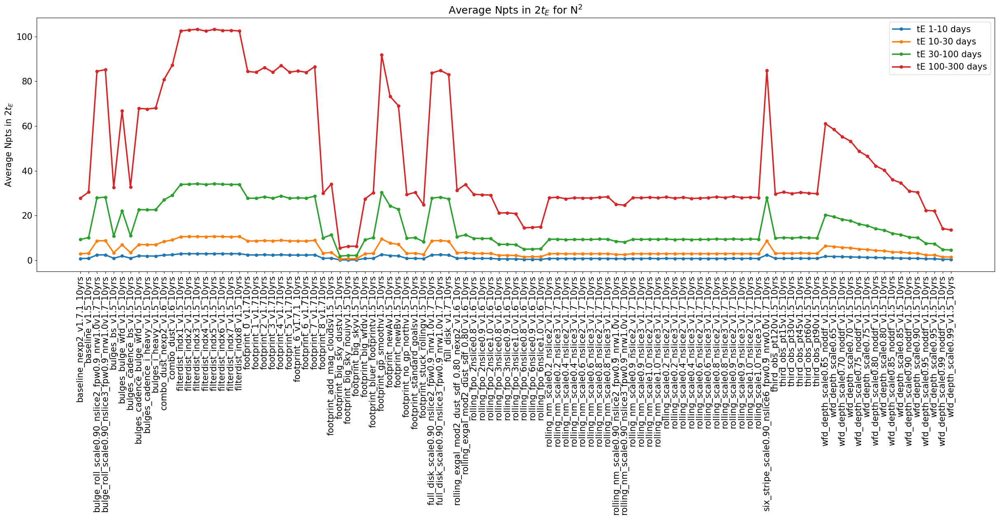

In [181]:
run_list_Npts_N2 = [tE_1_10_Npts_N2, tE_10_30_Npts_N2, tE_30_100_Npts_N2, tE_100_300_Npts_N2]

discovery_rate_hist(run_list_Npts_N2, run_names_N2, split_value_N2, events_per_point = 10000, plot_value = 'Average Npts in 2$t_E$', title_addition = 'for N$^2$')

### Currently it doesn't make sense why wfd and filterdist perform so poorly here, so these results were not yet included in the cadence note. Updated results will be included in future iterations

In [ ]:
run_list_Npts_besancon = [tE_0_10_Npts_besancon, tE_10_30_Npts_besancon, tE_30_100_Npts_besancon, tE_100_300_Npts_besancon]

discovery_rate_hist(run_list_Npts_besancon, run_names_besancon, split_value_besancon, events_per_point = 10000, plot_value = 'Average Npts in 2$t_E$', title_addition = 'for Besanc$\c{o}$n Galactic Plane')

## Multiply Discovery Rate by Average Npts

In [187]:
def discovery_rate_mult_avg_Npts(discovery_rate, Npts, events_per_point = 10000):
    """
    Multiply discovery rate by average Npts
    
    Inputs
    ---------------
    discovery_rate - df
    dataframe made from load_in_microlensing_metric_db() where the MicrolensingMetric
    computed the discovery rate
    
    Npts - df
    dataframe made from load_in_microlensing_metric_db() where the MicrolensingMetric
    computed the number of points within 2tE of the microlensing peak
    
    events_per_point - int or float (Optional)
    Number of simulated microlensing events per OpSim run.
    Default is 10000.
    
    Outputs
    ---------------
    mult_dataframe - df
    dataframe with the columns db which is the list of the database names from
    the discovery_rate matrix and discovery_rate*avg_Npts
    """
    database_name = []
    discovery_rate_avg_Npts = []
    DR_sorted = discovery_rate.sort_values('db').reset_index(drop = True)
    Npts_sorted = Npts.sort_values('db').reset_index(drop = True)
    for i in range(len(DR_sorted)):
        database_name.append(DR_sorted['db'][i])
        avg_Npts = Npts_sorted[(1, 'MicrolensingMetric')][i]/events_per_point
        discovery_rate = DR_sorted[(1, 'MicrolensingMetric')][i]
        discovery_rate_avg_Npts.append(discovery_rate*avg_Npts)
    mult_dataframe = pd.DataFrame({'db': database_name, (1, 'MicrolensingMetric'): discovery_rate_avg_Npts})
    return mult_dataframe

In [179]:
tE_1_10_DR_Npts_N2 = discovery_rate_mult_avg_Npts(tE_1_10_N2, tE_1_10_Npts_N2)
tE_10_30_DR_Npts_N2 = discovery_rate_mult_avg_Npts(tE_10_30_N2, tE_10_30_Npts_N2)
tE_30_100_DR_Npts_N2 = discovery_rate_mult_avg_Npts(tE_30_100_N2, tE_30_100_Npts_N2)
tE_100_300_DR_Npts_N2 = discovery_rate_mult_avg_Npts(tE_100_300_N2, tE_100_300_Npts_N2)

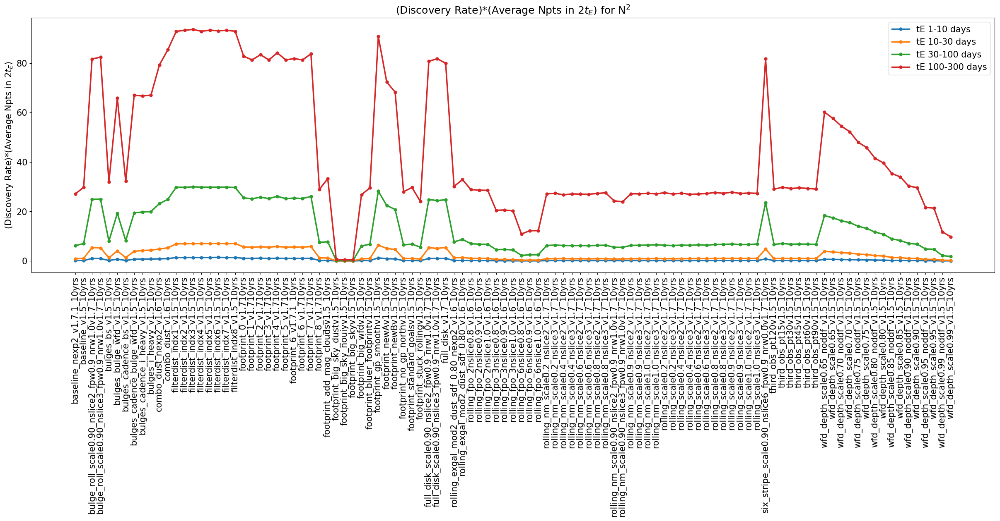

In [184]:
run_list_DR_Npts_N2 = [tE_1_10_DR_Npts_N2, tE_10_30_DR_Npts_N2, tE_30_100_DR_Npts_N2, tE_100_300_DR_Npts_N2]

discovery_rate_hist(run_list_DR_Npts_N2, run_names_N2, split_value_N2, events_per_point = 10000, plot_value = '(Discovery Rate)*(Average Npts in 2$t_E$)', title_addition = 'for N$^2$')

In [183]:
tE_0_10_DR_Npts_besancon = discovery_rate_mult_avg_Npts(tE_0_10_besancon, tE_0_10_Npts_besancon)
tE_10_30_DR_Npts_besancon = discovery_rate_mult_avg_Npts(tE_10_30_besancon, tE_10_30_Npts_besancon)
tE_30_100_DR_Npts_besancon = discovery_rate_mult_avg_Npts(tE_30_100_besancon, tE_30_100_Npts_besancon)
tE_100_300_DR_Npts_besancon = discovery_rate_mult_avg_Npts(tE_100_300_besancon, tE_100_300_Npts_besancon)

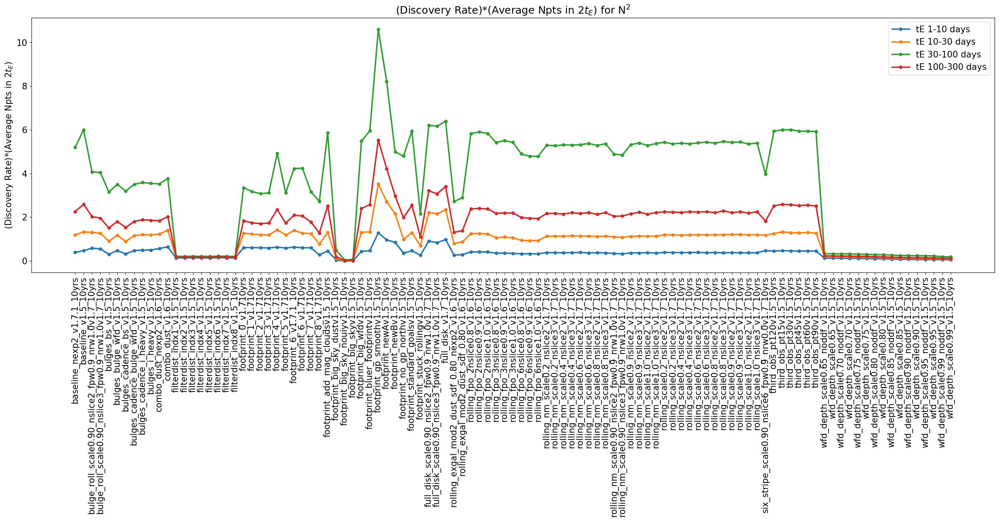

In [186]:
run_list_DR_Npts_besancon = [tE_0_10_DR_Npts_besancon, tE_10_30_DR_Npts_besancon, tE_30_100_DR_Npts_besancon, tE_100_300_DR_Npts_besancon]

discovery_rate_hist(run_list_DR_Npts_besancon, run_names_besancon, split_value_besancon, events_per_point = 10000, plot_value = '(Discovery Rate)*(Average Npts in 2$t_E$)', title_addition = 'for N$^2$')